# 社群媒體分析_Project

組名: 我的夢想是高雄市區有三棟透天

題目：四代韓團

使用工具：Python

組長：N114020002 張家佑

組員：N114320014 柯尚宏 N114320003 李芸甄

Date:2024/06/11

#一、動機和分析目的

K-pop 女團在全球範圍內擁有大量粉絲，其中 NewJeans、IVE、aespa、LESSERAFIM、NMIXX 和 ILLIT 是當前較具影響力的幾個女團。在台灣，Dcard 作為一個年輕人聚集的社交平台，成為了粉絲交流和討論偶像的重要場所。了解這些女團在 Dcard 追星版上的提及頻率及其情緒分析，可以揭示出粉絲對她們的關注度和情感反應，從而為娛樂公司、媒體和研究者提供有價值的參考資料。**通過分析 NewJeans、IVE、aespa、LESSERAFIM、NMIXX 和 ILLIT 在 Dcard 追星版上的提及頻率，了解哪個女團在台灣的受歡迎程度最高。**

#二、資料集描述

1.   時間範圍:2023/10/1-2024/5/25
2.   資料來源:Dcard追星版
3.   關鍵字:NewJeans,IVE,aespa,LESSERAFIM,NMIXX,ILLIT
4.   關鍵字選擇原因:主要選擇知名大型經紀公司如HYBE、SM、JYPE及Starship近年推出的女團

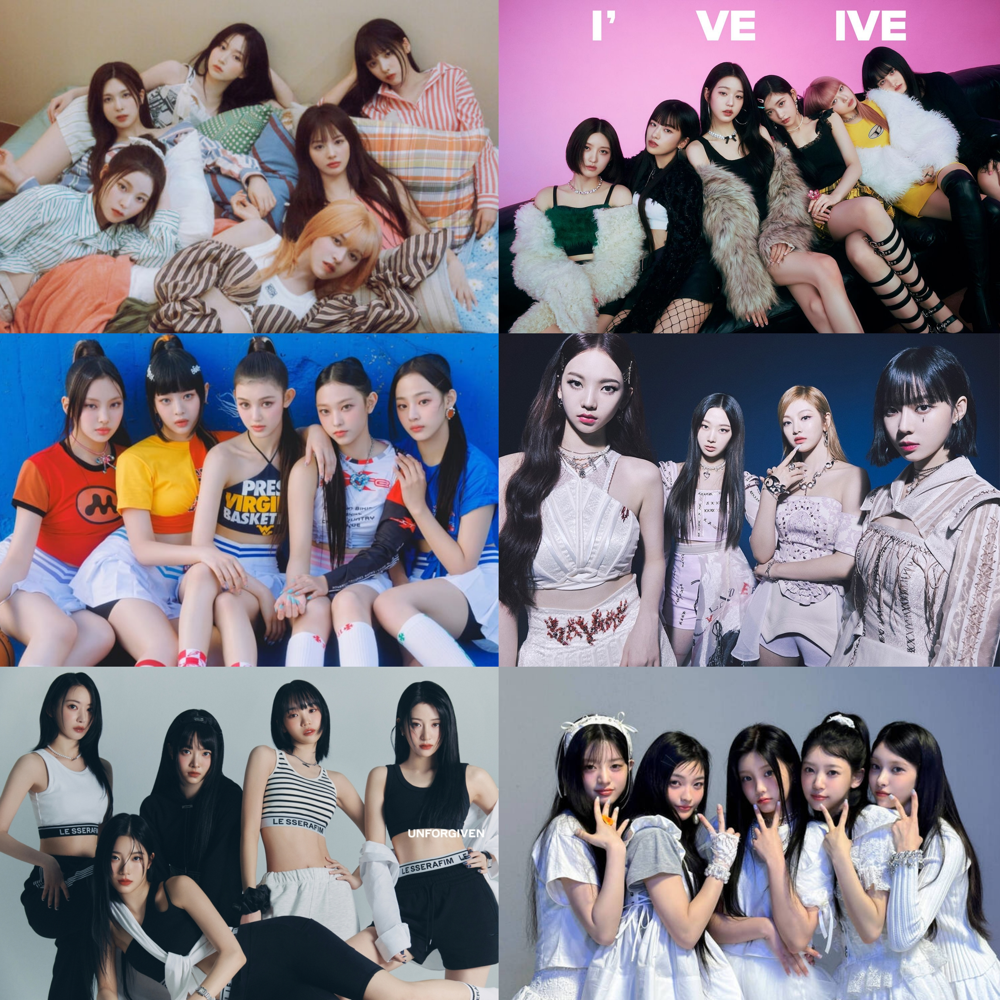

#三、資料前處理

以下為資料集的處理步驟

##(一)安裝套件

In [ ]:
import pandas as pd
import jieba
import jieba.analyse
import re
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.corpus import wordnet
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer
import re
from datetime import datetime
from collections import Counter
from tqdm import tqdm


# 下載斷句需要的資源
nltk.download('punkt')
# 下載POS tagger需要的資源
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('averaged_perceptron_tagger')
from nltk.corpus import stopwords
#下載停用詞
nltk.download('stopwords')


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from matplotlib.colors import Colormap
from wordcloud import WordCloud
import jieba
%matplotlib inline

# 設定圖的字體大小
plt.rcParams['font.size'] = 14

#設定文字雲中字體路徑
FontPath = '/content/drive/MyDrive/中山大學/社群媒體/SourceHanSansTW-Regular.otf'

plt.rcParams['font.sans-serif']=['SimHei'] #使 matplotilb 中文能正常顯示
fprop = fm.FontProperties(fname=FontPath)

# 設定整份 notebook 圖片的長寬與 dpi
plt.rcParams["figure.figsize"] = [6, 4]
plt.rcParams["figure.dpi"] = 150

##(二)導入文件

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
##讀取資料集
dcard_df = pd.read_csv('/content/drive/MyDrive/中山大學/社群媒體/project/dcard追星版_20231001_20240525.csv')
dcard_df["artDate"] = pd.to_datetime(dcard_df["artDate"])
dcard_df['artDate'] = dcard_df['artDate'].dt.date
dcard_df

,system_id,dataSource,artUrl,artDate,artTitle,artContent,boardID,commentCount,department,gender,school
0,1,Dcard,https://www.dcard.tw/f/entertainer/p/254297134,2023-12-31,#閒聊 日本紅白 夢幻聯動,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！\n\n陣容：ano、橋本環奈、櫻坂4...,entertainer,11,NaN,M,國立中央大學
1,2,Dcard,https://www.dcard.tw/f/entertainer/p/254297537,2023-12-31,#分享 🇯🇵 𝐍𝐇𝐊 紅白歌唱大賽 𝐘𝐎𝐀𝐒𝐎𝐁𝐈 和 𝐊-𝐏𝐎𝐏 愛豆特別合作舞台｜𝘁𝗵𝗲...,💫 𝘁𝗵𝗲𝗾𝗼𝗼 𝗛𝗢𝗧 💥\n\n❶\n原文：\nhttps://theqoo.net/h...,entertainer,2,shi_xian_nu_ya,F,耶咿(๑⃙⃘･֊･๑⃙⃘)⸝⋆︎*
2,3,Dcard,https://www.dcard.tw/f/entertainer/p/254295484,2023-12-31,#閒聊 20首2023年度K-Pop歌曲私選,\n來到年末，想要跟大家分享一下自己年度的K-Pop歌曲私選\n排名的部分純屬個人pick，...,entertainer,1,vincent0509,M,Vincent
3,4,Dcard,https://www.dcard.tw/f/entertainer/p/254291304,2023-12-31,#分享 2023韓國演藝圈重大事件回顧,［回顧2022年］\nhttps://www.dcard.tw/f/entertainer/...,entertainer,16,NaN,M,世新大學
4,5,Dcard,https://www.dcard.tw/f/entertainer/p/254287021,2023-12-30,#分享 免費DIY 2024偶像紅包袋,農曆春節即將來臨，想跟大家分享一款可以使用偶像照片製作紅包袋的APP～\n這款app是玩美相...,entertainer,5,jessie0728,F,jessie
...,...,...,...,...,...,...,...,...,...,...,...
784,785,Dcard,https://www.dcard.tw/f/entertainer/p/255318098,2024-04-20,#詢問 #詢問 TICC 4樓 b4排包廂區視野,就在剛剛 人生第一次搶票\n搶到了一直很想看的NMIXX\n但在挑選位置的時候\n手機有點秀...,entertainer,6,NaN,F,東吳大學
785,786,Dcard,https://www.dcard.tw/f/entertainer/p/255322058,2024-04-20,#分享 近期四代女團的火力(歌喉)展示！,可能是巧合，也可能是公司想緊跟時事順便自清？因為近期ILLIT和LE SSERAFIM的現場...,entertainer,42,mynameisfrank,M,曼徹斯特大學
786,787,Dcard,https://www.dcard.tw/f/entertainer/p/255321470,2024-04-20,#詢問 ILLIT要打歌到6/25是真的嗎？,因為2篇文都被刪除，所以我再發一次喔\n\n\n\n\n\n\n我是不知道我是哪裡踩一捧一、...,entertainer,19,seira1992,F,星羅
787,788,Dcard,https://www.dcard.tw/f/entertainer/p/255323884,2024-04-20,#分享 韓網HOT🔥寶礦力水得新廣告代言人提示,#清涼 #忙內女兒\n\n據說是ILLIT的沅禧\n\n來源: theqoo \nhttps...,entertainer,57,cycuc__,F,🎧🤍


In [ ]:
dcard_df['artContent'].head(5)

0    最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！\n\n陣容：ano、橋本環奈、櫻坂4...
1    💫 𝘁𝗵𝗲𝗾𝗼𝗼 𝗛𝗢𝗧 💥\n\n❶\n原文：\nhttps://theqoo.net/h...
2    \n來到年末，想要跟大家分享一下自己年度的K-Pop歌曲私選\n排名的部分純屬個人pick，...
3    ［回顧2022年］\nhttps://www.dcard.tw/f/entertainer/...
4    農曆春節即將來臨，想跟大家分享一款可以使用偶像照片製作紅包袋的APP～\n這款app是玩美相...
Name: artContent, dtype: object

In [ ]:
#修正時間部分
dcard_df['artDate'] = pd.to_datetime(dcard_df.artDate, format='%Y-%m-%d')
dcard_df

,system_id,dataSource,artUrl,artDate,artTitle,artContent,boardID,commentCount,department,gender,school
0,1,Dcard,https://www.dcard.tw/f/entertainer/p/254297134,2023-12-31,#閒聊 日本紅白 夢幻聯動,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！\n\n陣容：ano、橋本環奈、櫻坂4...,entertainer,11,NaN,M,國立中央大學
1,2,Dcard,https://www.dcard.tw/f/entertainer/p/254297537,2023-12-31,#分享 🇯🇵 𝐍𝐇𝐊 紅白歌唱大賽 𝐘𝐎𝐀𝐒𝐎𝐁𝐈 和 𝐊-𝐏𝐎𝐏 愛豆特別合作舞台｜𝘁𝗵𝗲...,💫 𝘁𝗵𝗲𝗾𝗼𝗼 𝗛𝗢𝗧 💥\n\n❶\n原文：\nhttps://theqoo.net/h...,entertainer,2,shi_xian_nu_ya,F,耶咿(๑⃙⃘･֊･๑⃙⃘)⸝⋆︎*
2,3,Dcard,https://www.dcard.tw/f/entertainer/p/254295484,2023-12-31,#閒聊 20首2023年度K-Pop歌曲私選,\n來到年末，想要跟大家分享一下自己年度的K-Pop歌曲私選\n排名的部分純屬個人pick，...,entertainer,1,vincent0509,M,Vincent
3,4,Dcard,https://www.dcard.tw/f/entertainer/p/254291304,2023-12-31,#分享 2023韓國演藝圈重大事件回顧,［回顧2022年］\nhttps://www.dcard.tw/f/entertainer/...,entertainer,16,NaN,M,世新大學
4,5,Dcard,https://www.dcard.tw/f/entertainer/p/254287021,2023-12-30,#分享 免費DIY 2024偶像紅包袋,農曆春節即將來臨，想跟大家分享一款可以使用偶像照片製作紅包袋的APP～\n這款app是玩美相...,entertainer,5,jessie0728,F,jessie
...,...,...,...,...,...,...,...,...,...,...,...
784,785,Dcard,https://www.dcard.tw/f/entertainer/p/255318098,2024-04-20,#詢問 #詢問 TICC 4樓 b4排包廂區視野,就在剛剛 人生第一次搶票\n搶到了一直很想看的NMIXX\n但在挑選位置的時候\n手機有點秀...,entertainer,6,NaN,F,東吳大學
785,786,Dcard,https://www.dcard.tw/f/entertainer/p/255322058,2024-04-20,#分享 近期四代女團的火力(歌喉)展示！,可能是巧合，也可能是公司想緊跟時事順便自清？因為近期ILLIT和LE SSERAFIM的現場...,entertainer,42,mynameisfrank,M,曼徹斯特大學
786,787,Dcard,https://www.dcard.tw/f/entertainer/p/255321470,2024-04-20,#詢問 ILLIT要打歌到6/25是真的嗎？,因為2篇文都被刪除，所以我再發一次喔\n\n\n\n\n\n\n我是不知道我是哪裡踩一捧一、...,entertainer,19,seira1992,F,星羅
787,788,Dcard,https://www.dcard.tw/f/entertainer/p/255323884,2024-04-20,#分享 韓網HOT🔥寶礦力水得新廣告代言人提示,#清涼 #忙內女兒\n\n據說是ILLIT的沅禧\n\n來源: theqoo \nhttps...,entertainer,57,cycuc__,F,🎧🤍


In [ ]:
#去除這次用不到的欄位
clear_df = dcard_df.copy()

#去除文章內容為空值的筆數
clear_df.dropna(subset = ['artContent'], axis=0, how='any', inplace=True)

#新增['sentence']欄位，用'。'取代'\n\n'，並移除'\n'
clear_df['sentence'] = clear_df['artContent'].str.replace(r'\n\n','。', regex=True)
clear_df['sentence'] = clear_df['sentence'].str.replace(r'\n','，', regex=True)

#移除內文中的網址
clear_df['sentence'] = clear_df['sentence'].replace(r'http\S+', '', regex=True)

#移除句子中的空格
clear_df['sentence'] = clear_df['sentence'].str.replace(" ", "")

#去除本次不會用到的欄位
drop_cols = ['system_id','boardID', 'commentCount','department','school','artUrl','artContent', 'dataSource']
clear_df.drop(drop_cols, axis = 1, inplace = True)

clear_df.head(10)

,artDate,artTitle,gender,sentence
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...
1,2023-12-31,#分享 🇯🇵 𝐍𝐇𝐊 紅白歌唱大賽 𝐘𝐎𝐀𝐒𝐎𝐁𝐈 和 𝐊-𝐏𝐎𝐏 愛豆特別合作舞台｜𝘁𝗵𝗲...,F,💫𝘁𝗵𝗲𝗾𝗼𝗼𝗛𝗢𝗧💥。❶，原文：，SSERAFIM、SEVENTEEN、StrayKids...
2,2023-12-31,#閒聊 20首2023年度K-Pop歌曲私選,M,，來到年末，想要跟大家分享一下自己年度的K-Pop歌曲私選，排名的部分純屬個人pick，但每...
3,2023-12-31,#分享 2023韓國演藝圈重大事件回顧,M,［回顧2022年］，韓國演藝圈重大事件回顧］。。•2023年公開的情侶👫。1.IU、李鐘碩（...
4,2023-12-30,#分享 免費DIY 2024偶像紅包袋,F,農曆春節即將來臨，想跟大家分享一款可以使用偶像照片製作紅包袋的APP～，這款app是玩美相機...
5,2023-12-31,#集中討論 2023MBC歌謠大祭典Live直播,F,今年的MBC歌謠祭在日山MBCDreamCenter舉辦，由SHINee珉豪、黃旼炫及從20...
6,2023-12-28,#分享 #分享 東方神起出道20週年展覽《TVXQ! EXHIBITION 20&2》,F,第一次發文就獻給喜歡14年的東神，如果發文上有錯誤請包涵！。✨前情提要一下：，剛好展覽活動時...
7,2023-12-30,#分享 【整理】PTT韓星版的JYP粉,M,實在是看不下去……，而且這只是近期的而已……。🔥Dcard的JYP粉整理，➡️B12。。，首...
8,2023-12-31,#詢問 aespa泡泡,F,想問一下寧寧和柚子哪個比較常上線～
9,2023-12-16,#分享 💙最近看起來失誤很多，讓人不安的 𝐚𝐞𝐬𝐩𝐚 𝐊𝐚𝐫𝐢𝐧𝐚 的服裝👗,F,💫𝘁𝗵𝗲𝗾𝗼𝗼𝗛𝗢𝗧💥。原文：， ，，鞋子的跟掉了，衣服上的針（在舞臺上發現的），還有已...


以上為資料前處理後的資料集

In [ ]:
#將清理後資料集儲存為csv檔
clear_df.to_csv("/content/drive/MyDrive/中山大學/社群媒體/project/dcard_news.csv", encoding = 'utf-8',index = True)

#四、資料分析與視覺化

##(一)ckip

###1.中文斷詞jieba

將經紀公司、團體名、人名等專有詞手動加入

'SM','JYPE','HYBE','YG','CUBE','IVE','aespa','NewJeans','NMIXX','LESSERAFIM','拍攝','StrayKids','NCTDREAM','RedVelvet','少女時代','BLACKPINK','BOYNEXTDOOR','(G)-IDLE','李俊昊'

In [ ]:
# 參數形式手動將字詞加入斷詞字典
words = ['最後','SM','JYPE','HYBE','YG','CUBE','IVE','aespa','NewJeans','NMIXX','LESSERAFIM','拍攝','StrayKids','NCTDREAM','RedVelvet','少女時代','BLACKPINK','BOYNEXTDOOR','(G)-IDLE','李俊昊']
for w in words:
    jieba.add_word(w, freq=None, tag=None)

Building prefix dict from the default dictionary ...
DEBUG:jieba:Building prefix dict from the default dictionary ...
Loading model from cache /tmp/jieba.cache
DEBUG:jieba:Loading model from cache /tmp/jieba.cache
Loading model cost 0.774 seconds.
DEBUG:jieba:Loading model cost 0.774 seconds.
Prefix dict has been built successfully.
DEBUG:jieba:Prefix dict has been built successfully.


是將一個包含中文句子的 DataFrame，進行中文分詞處理，將每個詞語作為一行單獨添加到新的 DataFrame 中，以便進一步進行文本分析或處理。

In [ ]:
dcard_token_df = clear_df.assign(word = clear_df['sentence'].apply(jieba.lcut)).explode('word')
dcard_token_df.head(30)

,artDate,artTitle,gender,sentence,word
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,最後
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,YOASOBI
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,表演
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,ア
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,イ
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,ド
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,ル
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,時
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,的
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,伴舞


###2.移除停用字前

對詞語進行頻率分析，找出出現頻率最高的前 10 個詞語及其出現次數，以便進一步進行文本分析或視覺化。

In [ ]:
freq_df = pd.DataFrame(pd.value_counts(dcard_token_df['word'])).sort_values(by = ['count'], ascending = False).reset_index()
freq_df.head(10)

,word,count
0,，,15729
1,的,7811
2,。,7396
3,.,2812
4,是,2458
5,了,2256
6,ㅋ,1818
7,我,1642
8,在,1557
9,-,1461


繪製了一個水平直方圖，展示出現頻率最高的前 10 個詞語及其出現次數，並將圖表的 y 軸方向反轉，以便更直觀地觀察出現頻率的高低。

將水平條形圖上的 y 軸刻度標籤的字體設置為特定字體，以確保圖表中的文字與文本內容的一致性。

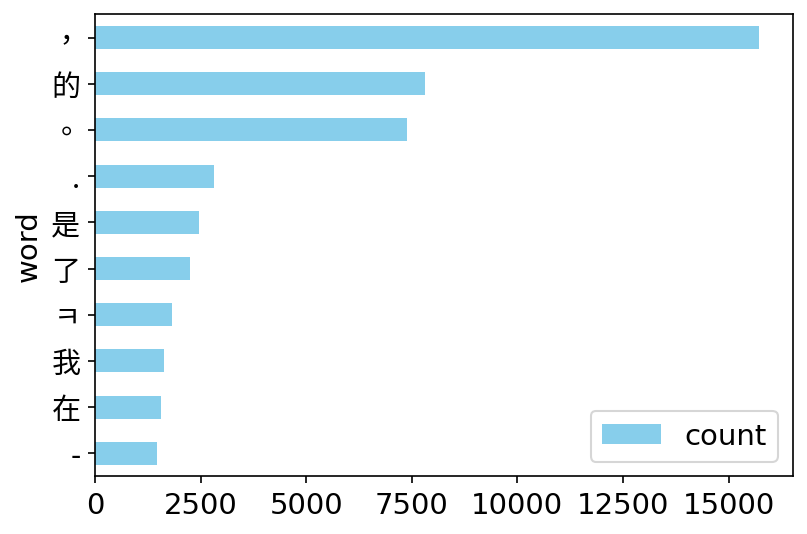

In [ ]:
#繪製水平長條圖並反轉y軸
ax = freq_df.head(10).plot.barh(x='word', y='count', color='skyblue')
ax.invert_yaxis()

# 設置字體
for label in ax.get_yticklabels():
    label.set_fontproperties(fprop)

plt.show()

可以發現出現頻率最高的為標點符號

In [ ]:
# wordcloud的輸入須為dict，因此先將freq_df轉換成成dict
freq_dict = freq_df.set_index('word').to_dict()
freq_dict = freq_dict['count']

freq_dict

{'，': 15729,
 '的': 7811,
 '。': 7396,
 '.': 2812,
 '是': 2458,
 '了': 2256,
 'ㅋ': 1818,
 '我': 1642,
 '在': 1557,
 '-': 1461,
 '、': 1443,
 '有': 1349,
 '也': 1323,
 '都': 1179,
 '很': 1174,
 ')': 985,
 '(': 978,
 '（': 937,
 '）': 896,
 '！': 842,
 '真的': 826,
 '就': 776,
 '好': 709,
 '：': 700,
 '說': 684,
 'NewJeans': 677,
 ':': 672,
 '」': 667,
 '「': 653,
 '》': 650,
 '但': 650,
 '不': 643,
 '《': 629,
 '會': 610,
 '和': 602,
 '來': 598,
 '？': 586,
 '/': 584,
 '—': 578,
 '人': 552,
 ',': 547,
 '後': 484,
 '大家': 440,
 'ㅠ': 432,
 '為': 431,
 '沒': 428,
 '看': 428,
 '到': 418,
 '3': 408,
 '可以': 400,
 '月': 399,
 '嗎': 391,
 '2': 390,
 '對': 389,
 '1': 387,
 'IVE': 386,
 '歌曲': 383,
 '4': 382,
 '聽': 378,
 '跟': 368,
 '上': 364,
 '們': 361,
 '專輯': 359,
 '她': 356,
 '?': 351,
 '因為': 349,
 '什麼': 347,
 '被': 347,
 '5': 343,
 '於': 340,
 '要': 339,
 '所以': 336,
 '"': 336,
 '他們': 336,
 '年': 333,
 '名': 324,
 '得': 319,
 '吧': 317,
 '啊': 315,
 '看到': 311,
 '想': 308,
 '公司': 304,
 '感覺': 302,
 '出道': 302,
 '讓': 297,
 '知道': 294,
 '不是': 290,
 '就

生成文字雲可以發現未刪除停用字前，看不出有效單詞，對分析無助益。

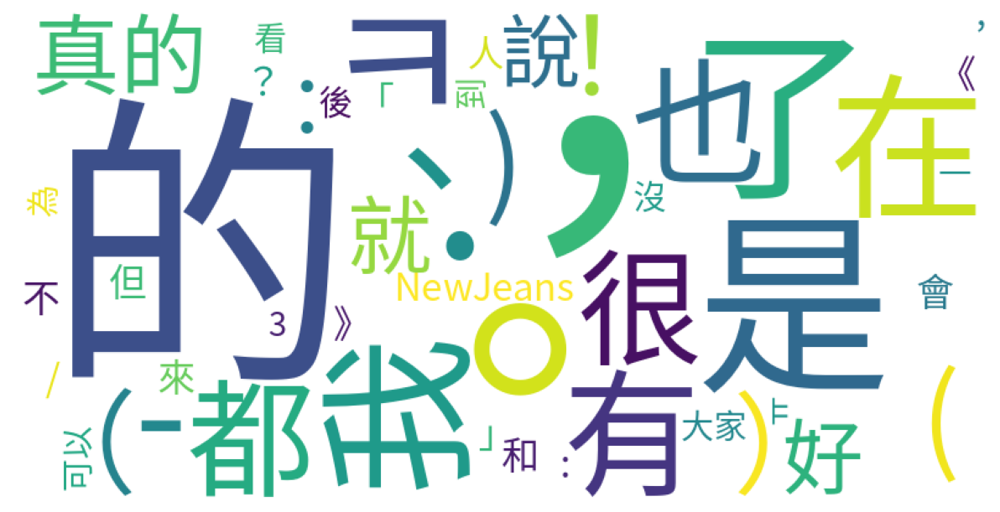

In [ ]:
# 繪製文字雲
wordcloud = WordCloud(background_color = 'white', width = 800, height = 400, font_path = FontPath, max_words = 50)
wordcloud.generate_from_frequencies(freq_dict)

plt.figure(figsize = (10,7))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

###3.移除停用字


首先從指定文件中讀取停用詞，將其存儲在 stopwords 列表中，然後將一些自定義的停用詞添加到這個列表中。最終的 stopwords 列表包含了文件中的停用詞和用戶自定義的停用詞。

"ㅋ":台灣於網路用語打哈哈，在韓國皆用"ㅋㅋ"代表哈哈，因此dcard上討論韓星皆使用此詞"ㅋ"代替哈哈表示韓國文化滲透網路用語。由於是無效詞，因此列入停用字辭典。

In [ ]:
# 匯入檔案形式
stopwords = []

# 對於這段文字所定義的停用字列表
with open(f'/content/drive/MyDrive/中山大學/社群媒體/project/stopword_dic.txt','r',encoding="utf8") as f:
    stopwords = f.read().splitlines() #移除換行符號\n

# 參數形式手動加入停用字
user_stop = ["的",'公司','真的','大家','ㅋ']
for i in user_stop:
    stopwords.append(i)

print(stopwords)

[',', '?', '、', '。', '“', '”', '《', '》', '！', '，', '：', '；', '？', '人民', '末##末', '啊', '阿', '哎', '哎呀', '哎喲', '唉', '我', '我們', '按', '按照', '依照', '吧', '吧噠', '把', '罷了', '被', '本', '本著', '比', '比方', '比如', '鄙人', '彼', '彼此', '邊', '別', '別的', '別說', '並', '並且', '不比', '不成', '不單', '不但', '不獨', '不管', '不光', '不過', '不僅', '不拘', '不論', '不怕', '不然', '不如', '不特', '不惟', '不問', '不只', '朝', '朝著', '趁', '趁著', '乘', '沖', '除', '除此之外', '除非', '除了', '此', '此間', '此外', '從', '從而', '打', '待', '但', '但是', '當', '當著', '到', '得', '的', '的話', '等', '等等', '地', '第', '叮咚', '對', '對於', '多', '多少', '而', '而況', '而且', '而是', '而外', '而言', '而已', '爾後', '反過來', '反過來說', '反之', '非但', '非徒', '否則', '嘎', '嘎登', '該', '趕', '個', '各', '各個', '各位', '各種', '各自', '給', '根據', '跟', '故', '故此', '固然', '關於', '管', '歸', '果然', '果真', '過', '哈', '哈哈', '呵', '和', '何', '何處', '何況', '何時', '嘿', '哼', '哼唷', '呼哧', '乎', '嘩', '還是', '還有', '換句話說', '換言之', '或', '或是', '或者', '極了', '及', '及其', '及至', '即', '即便', '即或', '即令', '即若', '即使', '幾', '幾時', '己', '既', '既然', '既是', '繼而', '加之', '假如', '假若', '假使', '鑒於', '將', '

In [ ]:
#移除停用字
dcard_noStop_df = dcard_token_df[~dcard_token_df['word'].isin(stopwords)]
dcard_noStop_df.head(10)

,artDate,artTitle,gender,sentence,word
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,最後
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,YOASOBI
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,表演
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,ア
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,イ
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,ド
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,ル
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,時
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,伴舞
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,陣容


In [ ]:
#字詞長度小於2則不納入考慮
dcard_noStop_df = dcard_noStop_df[dcard_noStop_df['word'].str.len() > 1]
dcard_noStop_df.head(10)

,artDate,artTitle,gender,sentence,word
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,最後
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,YOASOBI
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,表演
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,伴舞
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,陣容
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,太豪華
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,陣容
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,ano
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,橋本
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,環奈


####3-1計算詞頻

In [ ]:
# 因pandas版本較新會有warning,故以下進行改寫
# freq_df_1 = pd.DataFrame(pd.value_counts(udn_noStop_df['word'])).sort_values(by = ['count'], ascending = False).reset_index()
# freq_df_1.head(15)

#改寫部分
# 使用 pd.Series(obj).value_counts() 來計算詞頻
word_counts = pd.Series(dcard_noStop_df['word']).value_counts()

# # 將 Series 轉換為 DataFrame
freq_df_1 = pd.DataFrame({'word': word_counts.index, 'count': word_counts.values})

# # 按詞頻降序排序
freq_df_1 = freq_df_1.sort_values(by='count', ascending=False).reset_index(drop=True)
freq_df_1.head(15)

,word,count
0,NewJeans,677
1,IVE,386
2,歌曲,383
3,專輯,359
4,看到,311
5,感覺,302
6,出道,302
7,知道,294
8,女團,282
9,HYBE,280


####3-2wordcloud

從 freq_df_1 DataFrame 中創建了一個詞頻字典，然後顯示出詞頻最高的前 15 個詞語及其對應的出現次數。這樣可以快速查看文本中最常見的詞語及其頻率，便於進一步分析。







In [ ]:
# wordcloud的輸入須為dict，因此先將freq_df轉換成成dict
# freq_dict_1 = freq_df_1.set_index('word').to_dict()
# freq_dict_1 = freq_dict_1['count']

# freq_dict_1

#改寫部分
freq_df_1 = freq_df_1.copy()
freq_dict_1 = freq_df_1.set_index('word').to_dict()
freq_dict_1 = freq_dict_1['count']

#freq_dict_1.head(15)
for key, value in list(freq_dict_1.items())[:15]:
    print(key, value)

NewJeans 677
IVE 386
歌曲 383
專輯 359
看到 311
感覺 302
出道 302
知道 294
女團 282
HYBE 280
10 278
aespa 278
喜歡 273
成員 250
覺得 242


刪除停用字後可以發現一些韓國團體的名字及人名出現在文字雲上，但還是能發現有一些無效辭，因此再更新停用字辭典，再做第二次的刪除停用字。

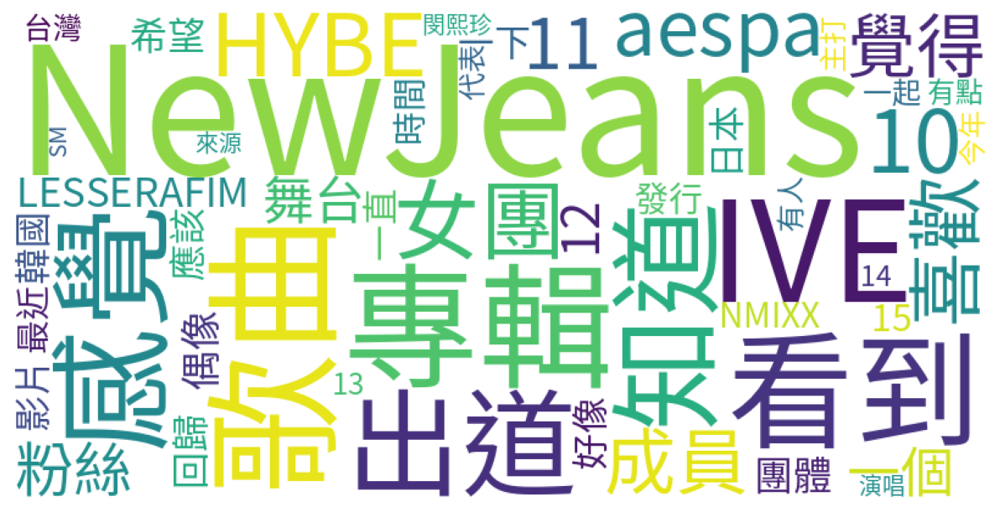

In [ ]:
# 繪製文字雲
wordcloud = WordCloud(background_color = 'white', width = 800, height = 400, font_path = FontPath, max_words = 50)
wordcloud.generate_from_frequencies(freq_dict_1)

plt.figure(figsize = (10,7))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

####3-3更新停用字字典

參考上一個文字雲，再新增停用字。

In [ ]:
# 參數形式手動加入停用字
stopwords_manual = ['今年','今天','0','1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','2023','2024','去年','最近','一起','一個','一下','一直','有點','已經','表示','看到','代表','感覺','看到','這是','知道','覺得','應該','MV','成員','成員們','女團','活動','韓國','台灣','出道','粉絲','粉絲們','韓網','pgngg','謝謝','翻譯','有人','留言','LE','這種','現在','好像','theqoo'
,'DLE','年度','這次','Stray','Kids','之前','目前','一定','by','直接','最後','完全','首歌']
stopwords.extend(stopwords_manual)

In [ ]:
dcard_df_2 = dcard_noStop_df[~dcard_noStop_df['word'].isin(stopwords)]
dcard_df_2.head(10)

,artDate,artTitle,gender,sentence,word
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,YOASOBI
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,表演
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,伴舞
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,陣容
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,太豪華
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,陣容
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,ano
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,橋本
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,環奈
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,櫻坂


In [ ]:
#字詞長度小於2則不納入考慮
dcard_df_2 = dcard_df_2[dcard_df_2['word'].str.len() > 1]
dcard_df_2.head(10)

,artDate,artTitle,gender,sentence,word
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,YOASOBI
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,表演
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,伴舞
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,陣容
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,太豪華
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,陣容
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,ano
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,橋本
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,環奈
0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,櫻坂


In [ ]:
word_counts2 = pd.Series(dcard_df_2['word']).value_counts()

# # 將 Series 轉換為 DataFrame
freq_df_2 = pd.DataFrame({'word': word_counts2.index, 'count': word_counts2.values})

# # 按詞頻降序排序
freq_df_2 = freq_df_2.sort_values(by='count', ascending=False).reset_index(drop=True)
freq_df_2.head(15)

,word,count
0,NewJeans,677
1,IVE,386
2,歌曲,383
3,專輯,359
4,HYBE,280
5,aespa,278
6,喜歡,273
7,舞台,210
8,LESSERAFIM,206
9,偶像,205


將 DataFrame 中詞語及其出現次數的數據轉換為字典格式，其中詞語作為字典的key，詞語的出現次數作為字典的值，方便後續進行詞頻分析或視覺化。

In [ ]:
# wordcloud的輸入須為dict，因此先將freq_df轉換成成dict
freq_dict_2 = freq_df_2.set_index('word').to_dict()
freq_dict_2 = freq_dict_2['count']

freq_dict_2

{'NewJeans': 677,
 'IVE': 386,
 '歌曲': 383,
 '專輯': 359,
 'HYBE': 280,
 'aespa': 278,
 '喜歡': 273,
 '舞台': 210,
 'LESSERAFIM': 206,
 '偶像': 205,
 '團體': 198,
 '希望': 185,
 '回歸': 182,
 '日本': 168,
 '影片': 158,
 '發行': 154,
 'NMIXX': 153,
 '時間': 149,
 '主打': 139,
 '閔熙珍': 131,
 '演唱': 130,
 'SM': 129,
 '來源': 129,
 '歌手': 120,
 '分享': 119,
 '表演': 115,
 'ILLIT': 114,
 '音源': 113,
 '照片': 111,
 'ITZY': 110,
 '風格': 108,
 '舞蹈': 106,
 '漂亮': 105,
 'BLACKPINK': 104,
 '藝人': 104,
 '實力': 104,
 '問題': 103,
 '適合': 102,
 'SEVENTEEN': 100,
 '期待': 100,
 'StrayKids': 100,
 '特別': 99,
 'TWICE': 98,
 '音樂': 95,
 '人氣': 89,
 '俊昊': 89,
 '歡迎': 87,
 '最佳': 87,
 '討論': 87,
 '想到': 86,
 '發現': 86,
 '進行': 85,
 '一些': 84,
 '部分': 83,
 '朋友': 83,
 'TXT': 83,
 'RIIZE': 81,
 '銷量': 81,
 '第一': 81,
 '組合': 80,
 '認為': 79,
 '轉載': 79,
 '評論': 78,
 '萬張': 78,
 '我覺': 77,
 '新人': 77,
 '超級': 74,
 '出現': 73,
 '全球': 73,
 '防彈': 73,
 '兩個': 72,
 '追星': 72,
 '現場': 72,
 '第一次': 72,
 'Karina': 70,
 'ADOR': 70,
 'JYP': 70,
 '推薦': 69,
 'BTS': 68,
 '成績': 68,
 '中國': 66,
 '

進行兩次停用字刪除後，可以看出四代團較具代表性的如NewJeans, IVE, aespa, LESSERAFIM, NMIXX, ILLIT仍存在討論度顯著差異，例如，NewJeans 和 IVE 等團體相較其他團在Dcard中非常受歡迎，討論熱度較高。

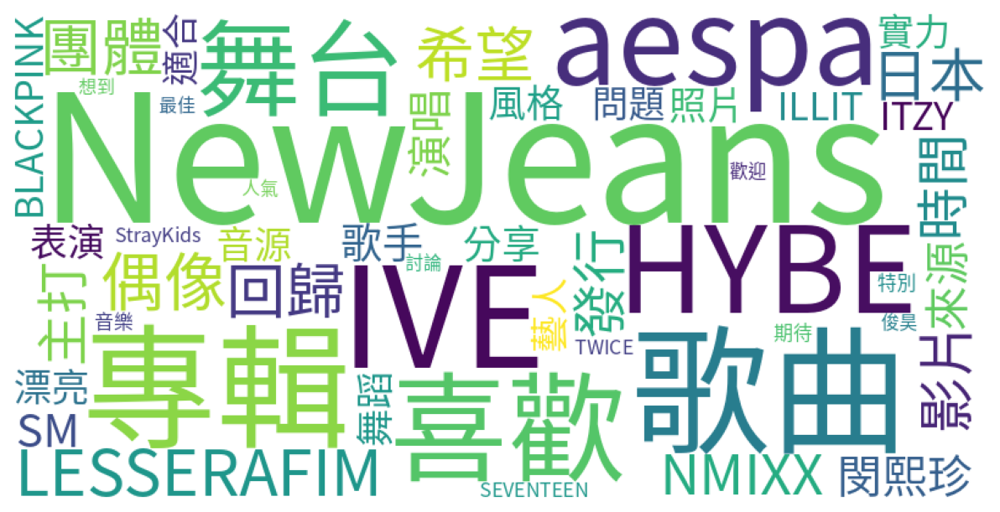

In [ ]:
# 繪製文字雲
wordcloud_2 = WordCloud(background_color = 'white', width = 800, height = 400, font_path = FontPath, max_words = 50)
wordcloud_2.generate_from_frequencies(freq_dict_2)

plt.figure(figsize = (10,7))
plt.imshow(wordcloud_2)
plt.axis('off')
plt.show()

####3-4比較清理前後的文字雲

將兩個詞雲圖放置在同一個頁面上進行比較，方便查看兩者之間的差異或相似性。

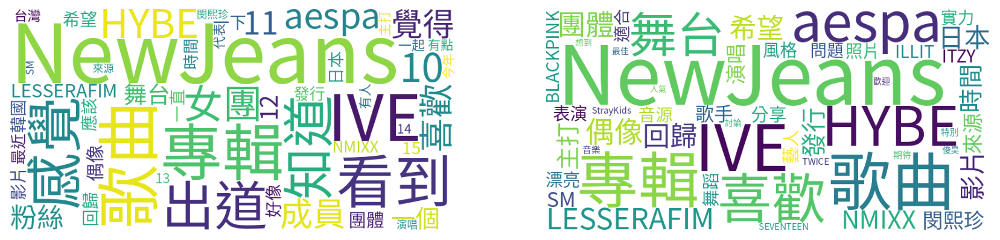

In [ ]:
plt.figure(figsize = (14,8))

plt.subplot(1,2,1)
plt.imshow(wordcloud)
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(wordcloud_2)
plt.axis('off')

plt.show()

###4.結論

1.從清理後的文字雲可以看出最常被提及依序為NewJeans>IVE>aespa>LESSERAFIM>NMIXX>ILLIT

2.可以得知網友最常討論團體的專輯、歌曲跟舞台。

3.可能是我們主要選女團，所以"漂亮"這詞也可以從文字雲看到。

4.閔熙珍為NewJeans的製作人，由於4月22日閔熙珍與HYBE內鬥，因此雖然閔非藝人，但因為股東爭議影響NewJeans而導致討論頻率增加，其名方才出現在文字雲裡。

##(二)情緒分析

###1.Bert model-chinese_sentiment
此部分本小組用bert情緒模型來分析文章(長句)的情緒值

使用 Huggingface 上面已經針對 Sentiment classification 任務 finetune 的 BERT 模型來實作
使用的模型：https://huggingface.co/techthiyanes/chinese_sentiment

在 Huggingface 的 techthiyanes/chinese_sentiment 模型中,star 和 score 都是用來表示情感分數,但略有不同:

1. **score**
score 是模型直接輸出的一個0到1之間的浮點數值,表示文本的情感傾向分數。具體含義如下:
- 0.0-0.2: 極負面
- 0.2-0.4: 負面  
- 0.4-0.6: 中性
- 0.6-0.8: 正面
- 0.8-1.0: 極正面

2. **star**
star 則是根據 score 的值,將情感分成5個等級,用星級(1-5星)來表示,對應關係如下:
- 1星: score 0.0-0.2 (極負面)
- 2星: score 0.2-0.4 (負面)
- 3星: score 0.4-0.6 (中性)
- 4星: score 0.6-0.8 (正面)
- 5星: score 0.8-1.0 (極正面)

所以 score 給出了一個連續的情感分數,而 star 則是將這個連續的分數離散化為5個等級,用更直觀的星級來表示情感傾向的程度。

在使用這個模型時,你可以根據實際需求選擇使用 score 或 star 作為輸出。如果需要精確的情感分數,可以使用 score;如果只需要一個大致的情感等級即可,star 可能會更直觀一些。

兩者都是表示文本情感傾向的有效方式,主要還是根據你的具體應用場景選擇更合適的輸出形式。

導入了 pandas 庫和 Hugging Face 的 transformers 庫，並創建了一個名為 new_clear_df 的 DataFrame，它是 clear_df 的副本。 這樣做可以在不改變原始數據的情況下進行後續的處理和分析，確保數據的安全性。







實現了載入預訓練情感分類模型以及對應的分詞器，為後續的情感分析任務做好了準備

創建了一個空的 DataFrame，用於存儲情感分析的結果。 然後，通過情感分析管道 『sentiment_pipeline』 對每個句子進行情感分析，並將分析結果（情感標籤和情感得分）存儲到 DataFrame 中

In [ ]:
clear_df_2 = pd.read_csv('/content/drive/MyDrive/中山大學/社群媒體/project/aggregated_df_2.csv')

In [ ]:
# 獲取模型的最大輸入長度max_length。因bert模型最大長度為512字元
# 在創建sentiment_pipeline時,添加了truncation=True和max_length=max_length兩個參數,
# 以確保超長輸入會被自動截斷到允許的最大長度。
# 對於長度超過512的輸入句子,會被自動截斷到512個token,從而避免了RuntimeError的發生。

import pandas as pd
from transformers import AutoTokenizer, AutoModelForSequenceClassification, pipeline

new_clear_df = clear_df_2.copy()

# 載入tokenizer和模型
model_name = "techthiyanes/chinese_sentiment"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForSequenceClassification.from_pretrained(model_name)
max_length = model.config.max_position_embeddings  # 獲取模型的最大輸入長度

# 建立情感分析pipeline
sentiment_pipeline = pipeline('text-classification', model=model, tokenizer=tokenizer, truncation=True, max_length=max_length)

# 建立一個新的 dataframe 來儲存結果
results_df = pd.DataFrame(columns=['sentence', 'label', 'score'])
results_df['sentence'] = new_clear_df['sentence']

# 定義一個函數來進行情緒分析
def analyze_sentiment(sentence):
    # 進行情緒分析
    outputs = sentiment_pipeline(sentence)[0]
    # 從模型輸出中提取label和score
    label = outputs['label']
    score = outputs['score']
    return pd.Series([label, score])

# 使用 apply 函數來進行情緒分析
results_df[['label', 'score']] = results_df['sentence'].apply(analyze_sentiment)

# 輸出結果
#print(results_df)
results_df

,sentence,label,score
0,YOASOBI 表演 伴舞 陣容 太 豪華 陣容 ano 橋本 環奈 櫻坂 46JO1 St...,star 5,0.355902
1,原文 SSERAFIMSEVENTEEN StrayKids MISAMO 韓評 利用 PO...,star 5,0.306162
2,年末 想要 分享 Pop 歌曲 私選 排名 部分 純屬 pick 一首歌 喜歡 評選 標準 ...,star 5,0.268473
3,回顧 2022 演藝圈 重大事件 回顧 公開 情侶 IU 李鐘 元旦 情侶 李到 林智妍 黑...,star 4,0.300908
4,春節 將來 分享 一款 使用 偶像 照片 包袋 APP 這款 app 美 相機 app 裡 ...,star 5,0.692485
...,...,...,...
767,剛剛 人生 第一次 搶票 搶 到 NMIXX 挑選 位置 手機 點秀抖 想要 小看 哪裡 位...,star 5,0.573535
768,巧合 想緊 時事 順自清 近期 ILLIT LESSERAFIM 現場 歌唱 實力 引發 軒...,star 5,0.327578
769,篇文 刪除 一次 哪裡 人身攻擊 伸手 文了 ILLIT 有無 要 打歌 25 希望 好心人...,star 1,0.531058
770,清涼 女兒 ILLIT 沅禧 來源 適合 廣告 不愧 HYBE 適合 寶礦力 水得 青春 學...,star 5,0.540076


正面情緒共有648篇文章

In [ ]:
#正向情緒:star4及star5
bert_positive_df = results_df[results_df["label"].isin(['star 5', 'star 4'])]
bert_positive_df

,sentence,label,score
0,YOASOBI 表演 伴舞 陣容 太 豪華 陣容 ano 橋本 環奈 櫻坂 46JO1 St...,star 5,0.355902
1,原文 SSERAFIMSEVENTEEN StrayKids MISAMO 韓評 利用 PO...,star 5,0.306162
2,年末 想要 分享 Pop 歌曲 私選 排名 部分 純屬 pick 一首歌 喜歡 評選 標準 ...,star 5,0.268473
3,回顧 2022 演藝圈 重大事件 回顧 公開 情侶 IU 李鐘 元旦 情侶 李到 林智妍 黑...,star 4,0.300908
4,春節 將來 分享 一款 使用 偶像 照片 包袋 APP 這款 app 美 相機 app 裡 ...,star 5,0.692485
...,...,...,...
766,打擾 剛搶 NMIXX fanconcert 門票 朋友 幫忙 總共 搶 兩張 預算 的關 ...,star 5,0.335717
767,剛剛 人生 第一次 搶票 搶 到 NMIXX 挑選 位置 手機 點秀抖 想要 小看 哪裡 位...,star 5,0.573535
768,巧合 想緊 時事 順自清 近期 ILLIT LESSERAFIM 現場 歌唱 實力 引發 軒...,star 5,0.327578
770,清涼 女兒 ILLIT 沅禧 來源 適合 廣告 不愧 HYBE 適合 寶礦力 水得 青春 學...,star 5,0.540076


中性情緒共有70篇文章

In [ ]:
#中性情緒:star3
bert_normal_df = results_df[results_df["label"] == 'star 3']
bert_normal_df

,sentence,label,score
8,想問 寧寧 柚子 較常 上線,star 3,0.297817
18,無聊 搜尋 了 IVE 發現 這 兩個 點閱 差太多 幾個 星船 希望 點閱 回升 IAM ...,star 3,0.350395
30,韓團 突然 李瑞 E1and 打中 正題 粉絲 濾鏡 太重,star 3,0.403663
51,想問 一排 比較 雙 前排 比 側面 二樓 然後 差 1000 三排 超側 排是 還好 提供...,star 3,0.377942
52,曾經 ig 看過 newjeans 分別 彩色 背板 流出 跳舞 歌曲歌詞 突然 想要 要查...,star 3,0.280751
...,...,...,...
725,ILLIT 暗示性 素材 啟發 創意 團隊 找來 各國 分析 客觀 看看 灰調 濾鏡 發現 ...,star 3,0.391905
732,Newjeans 以來 曲風 大部分 輕快 不用 高音 饒舌 專精 成員 聲音 Hanni ...,star 3,0.559327
742,沒什麼 追星 一陣子 演唱會 限時 動態 好奇 表演 影片 發現 團的 舞蹈 是不是 相比 ...,star 3,0.648036
753,維基百科 部分 資料 刪掉 並鎖,star 3,0.294056


負面情緒共有54篇文章

In [ ]:
#負面情緒:star1及star2
bert_negative_df = results_df[results_df["label"].isin(['star 1', 'star 2'])]
bert_negative_df

,sentence,label,score
7,實在 看不下去 近期 DcardJYP 整理 B12 韓星版 版主 發過 推文 JYPPTT...,star 2,0.369344
9,原文 鞋子 衣服 上的針 發現 經 斷斷 掉 肩帶 Twitteraesdive 韓評 右上...,star 2,0.331616
22,臉 書社 團 代購 aespa BetterThings 閃卡 明信片 拆封 過後 發現 明...,star 1,0.505695
64,本名 銀行帳號 74812 還在 希望 受害者 不容許 這種 繼續 詐騙 社團 粉專 聲稱 ...,star 1,0.488802
71,變成 看過 告訴,star 1,0.396236
120,安妞 還記 半年前 IVE 來台 演唱 鬼故事 更新 續集 圖多慎入 希望 喜歡 團來 遇到...,star 2,0.253513
163,原本 發在 網購 那位 賣家 專門 代購 韓團 周邊 分享 來給 剛剛 追星 發現 這位 魚...,star 1,0.266575
168,請問 一件 外套 品牌 哪裡 剛剛 以圖 搜圖 搜過 不到 高手,star 1,0.668836
181,如 題 專輯 面 點擊 歌曲 點到 DontBlink 時會 自動播放 一首 螢幕 錄影 示...,star 2,0.359225
183,想問 Karina 剛剛 IG 發文 照片 下面 特效 名稱 剛剛 特效 名稱 找到 APP...,star 1,0.391738


**結論:Dcard韓星版的文章討論以正面情緒為主。**

###2.LIWC

首先從指定路徑讀取了一個名為 LIWC_CH.csv 的文件，該文件可能包含情感詞典或相關數據。 接著，將這個 DataFrame 的列名 "name" 改為 "word"，將 "class" 改為 "sentiments"，這樣做是為了更清晰地表示詞和它們所屬的情感類別。 最後，將 DataFrame 的前幾行產生出來，以便檢查詞和情感類別的格式是否正確。

In [ ]:
# 讀取情緒字典
liwc_dict = pd.read_csv("/content/drive/MyDrive/中山大學/社群媒體/project/LIWC_CH.csv")
liwc_dict = liwc_dict.rename(columns={'name': 'word', "class": 'sentiments'})
liwc_dict.head()

,word,sentiments
0,):,affect
1,3q,affect
2,:(,affect
3,:),affect
4,<3,affect


將情緒字典與斷詞結果進行合併。

In [ ]:
dcard_liwc_df = pd.merge(dcard_df_2[["artTitle", "artDate", "sentence", "word"]], liwc_dict, how="left")
dcard_liwc_df

,artTitle,artDate,sentence,word,sentiments
0,#閒聊 日本紅白 夢幻聯動,2023-12-31,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,YOASOBI,NaN
1,#閒聊 日本紅白 夢幻聯動,2023-12-31,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,表演,NaN
2,#閒聊 日本紅白 夢幻聯動,2023-12-31,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,伴舞,NaN
3,#閒聊 日本紅白 夢幻聯動,2023-12-31,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,陣容,NaN
4,#閒聊 日本紅白 夢幻聯動,2023-12-31,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,太豪華,NaN
...,...,...,...,...,...
74137,#閒聊 追星前vs.追星後？,2024-04-20,突然想到的問題，大家有什麼變化呢？。我自己是👇，-，-，-，追星前：花美男+長髮嗯……ಠ_ಠ...,告知,NaN
74138,#閒聊 追星前vs.追星後？,2024-04-20,突然想到的問題，大家有什麼變化呢？。我自己是👇，-，-，-，追星前：花美男+長髮嗯……ಠ_ಠ...,有錯,NaN
74139,#閒聊 追星前vs.追星後？,2024-04-20,突然想到的問題，大家有什麼變化呢？。我自己是👇，-，-，-，追星前：花美男+長髮嗯……ಠ_ಠ...,告知,NaN
74140,#閒聊 追星前vs.追星後？,2024-04-20,突然想到的問題，大家有什麼變化呢？。我自己是👇，-，-，-，追星前：花美男+長髮嗯……ಠ_ಠ...,分享,affect


用於計算每個日期中正負情感詞彙的使用情況，並將結果存儲在一個 DataFrame 中。

In [ ]:
sentiment_count = pd.DataFrame(
    dcard_liwc_df.groupby(["artDate", "sentiments"]).size()

).reset_index()

mask = (sentiment_count['sentiments'] == "positive") | (sentiment_count['sentiments'] == "negative")
sentiment_count = sentiment_count.loc[mask]

sentiment_count = sentiment_count.rename(columns={0: "size"})
sentiment_count = sentiment_count.sort_values(["artDate"])
sentiment_count

,artDate,sentiments,size
1,2023-10-01,negative,4
2,2023-10-01,positive,3
4,2023-10-02,negative,1
5,2023-10-02,positive,14
7,2023-10-03,positive,4
...,...,...,...
866,2024-05-17,positive,35
870,2024-05-18,negative,5
871,2024-05-18,positive,10
874,2024-05-19,negative,2


正負情緒詞彙頻率折線圖。

2023年11月正面情緒高，因為10 、11月有不少韓團、韓星都相繼宣告回歸，IVE、Seventeen等大勢韓團推出新碟，還有已經休團一段時間的Red Velevet、國民妖精李孝利和BTS柾國等近50組藝人確定將會推出新作。

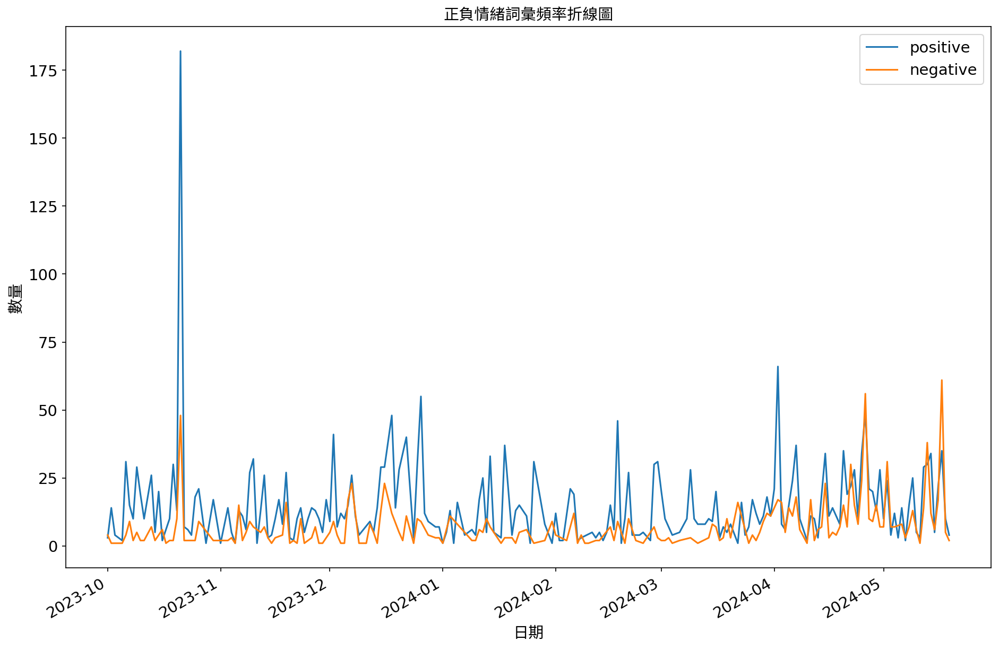

In [ ]:
colors = ["tab:blue", "tab:orange"]
pos = sentiment_count[sentiment_count["sentiments"] == "positive"]
neg = sentiment_count[sentiment_count["sentiments"] == "negative"]

# fig, ax = plt.subplots(figsize = (6,4), dpi = 150) # 也可以在該圖設定參數
fig, ax = plt.subplots(figsize = (15,10))

ax.plot(pos["artDate"], pos["size"], color=colors[0])
ax.plot(neg["artDate"], neg["size"], color=colors[1])

#plt.xlabel("artDate")
plt.xlabel("日期", fontproperties=fprop)
plt.ylabel("數量", fontproperties=fprop)
ax.legend(["positive", "negative"], loc="upper right")
fig.autofmt_xdate()
plt.title("正負情緒詞彙頻率折線圖", fontproperties=fprop)  # 記得加上才能顯示中文
plt.show()

正負情緒聲量折線圖。

雖然正負面情緒皆有但dcard上的韓星版仍分享正面事物例如新發布事物或成員參加新活動等，興奮喜愛的正面情緒為主。

韓國電視台於4月13日於高雄世運主場館舉辦韓團拼盤演唱會。
台灣主辦單位－超級圓頂娛樂在售票前一日(3月15日)突然宣布不開放二樓座位購票僅開放一樓，並且購票時無法選擇座位區域，這使得粉絲們需要依靠運氣來獲得理想的座位​。此外，粉絲們在購票過程中遇到網站卡頓、無法順利購票的問題，導致許多粉絲無法成功購票而感到不滿​。

這些問題引發了大量粉絲的批評，認為主辦單位的操作缺乏透明度，並質疑這些措施是否是為了保留更多的「公關票」而設計的​。最後在演唱會開演(4月13日)前7天才公布二樓及三樓的售票資訊，使得外縣市粉絲更為不滿。

因此三月底至四月初的負面情緒突然大增。

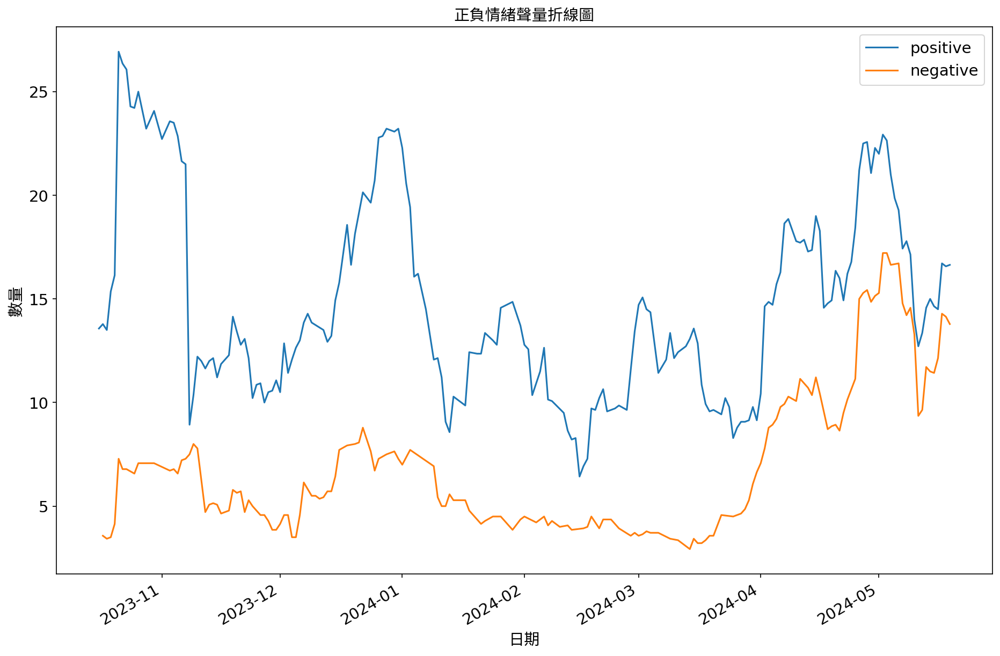

In [ ]:
colors = ["tab:blue", "tab:orange"]
pos = sentiment_count[sentiment_count["sentiments"] == "positive"]
neg = sentiment_count[sentiment_count["sentiments"] == "negative"]

# fig, ax = plt.subplots(figsize = (6,4), dpi = 150) # 也可以在該圖設定參數
fig, ax = plt.subplots(figsize = (15,10))

# 使用 Series.rolling().mean() 來產生 14 天平均
rolling_days = 14
ax.plot(pos["artDate"], pos['size'].rolling(rolling_days).mean(), color=colors[0])
ax.plot(neg["artDate"], neg["size"].rolling(rolling_days).mean(), color=colors[1])

#plt.xlabel("artDate")
plt.xlabel("日期", fontproperties=fprop)
plt.ylabel("數量", fontproperties=fprop)
# plt.ylabel('size')
ax.legend(["positive", "negative"], loc="upper right")
fig.autofmt_xdate()
plt.title("正負情緒聲量折線圖", fontproperties=fprop)  # 記得加上才能顯示中文
plt.show()

正負向情緒詞彙比例折線圖

In [ ]:
sentiment_count = sentiment_count.assign(
    ratio=sentiment_count.groupby("artDate")["size"].transform(lambda n: n / n.sum())
)
sentiment_count

,artDate,sentiments,size,ratio
1,2023-10-01,negative,4,0.571429
2,2023-10-01,positive,3,0.428571
4,2023-10-02,negative,1,0.066667
5,2023-10-02,positive,14,0.933333
7,2023-10-03,positive,4,1.000000
...,...,...,...,...
866,2024-05-17,positive,35,0.364583
870,2024-05-18,negative,5,0.333333
871,2024-05-18,positive,10,0.666667
874,2024-05-19,negative,2,0.333333


用於從 sentiment_count DataFrame 中選擇情感類別為 "positive" 和 "negative" 的行，並分別存儲在 pos 和 neg 中。這樣做是為了將正向情緒和負向情緒的數據分開處理，以便後續的分析和視覺化。

In [ ]:
pos = sentiment_count[sentiment_count["sentiments"] == "positive"]
neg = sentiment_count[sentiment_count["sentiments"] == "negative"]

用於繪製正負情緒比例的折線圖

Text(0.5, 1.0, '正負情緒比例折線圖')

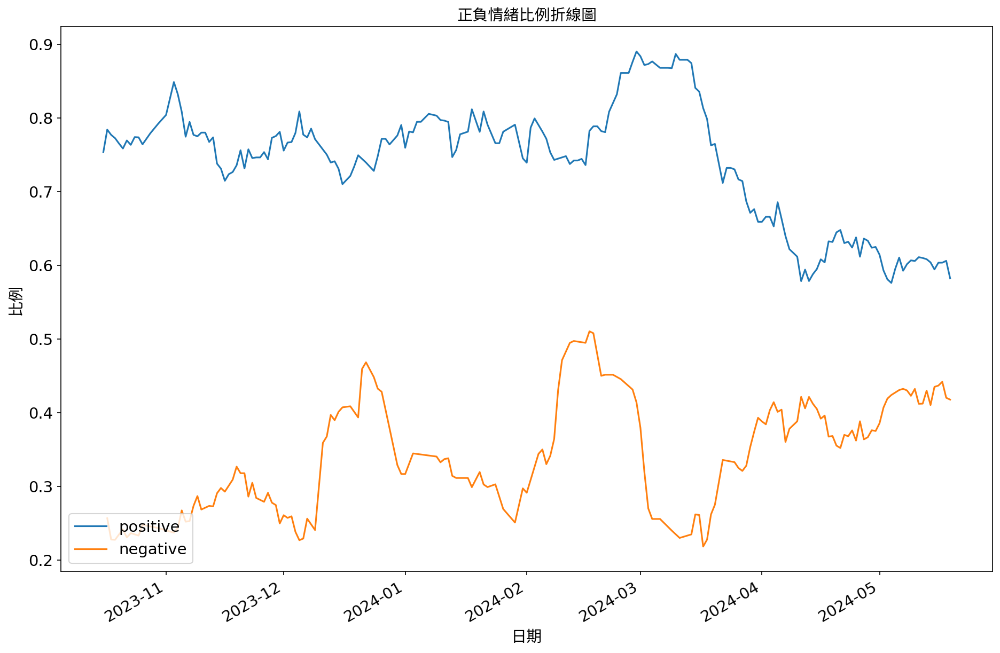

In [ ]:
#fig, ax = plt.subplots()
fig, ax = plt.subplots(figsize = (15,10))
rolling_days = 14
ax.plot(pos["artDate"], pos["ratio"].rolling(rolling_days).mean(), color=colors[0])
ax.plot(neg["artDate"], neg["ratio"].rolling(rolling_days).mean(), color=colors[1])

plt.xlabel("日期", fontproperties=fprop)
plt.ylabel("比例", fontproperties=fprop)
ax.legend(["positive", "negative"], loc="lower left")
fig.autofmt_xdate()
plt.title("正負情緒比例折線圖", fontproperties=fprop)

可以看出與上圖情形相似。

###3.情緒代表字

這段程式碼用於計算每個詞彙在正負情感類別中出現的次數

In [ ]:
word_count = dcard_liwc_df.groupby(["word", "sentiments"]).size().reset_index()
word_count = word_count.rename(columns={0: "size"})
word_count = word_count.sort_values(["size"], ascending=False)
word_count

,word,sentiments,size
313,喜歡,positive,273
312,喜歡,affect,273
485,希望,affect,185
486,希望,positive,185
174,分享,affect,119
...,...,...,...
1470,驚慌,anx,1
1471,驚慌,negative,1
1475,驚險,affect,1
1476,驚險,negative,1


這程式碼從 word_count DataFrame 中選擇了情感類別為 "positive" 的詞彙，並返回了前 15 個結果。 這樣做是為了查看在正向情感中出現頻率最高的詞彙。

In [ ]:
word_of_pos = word_count.loc[(word_count["sentiments"] == "positive")]
word_of_pos.head(15)

,word,sentiments,size
313,喜歡,positive,273
486,希望,positive,185
175,分享,positive,119
941,漂亮,positive,105
1383,適合,positive,102
788,最佳,positive,87
854,歡迎,positive,87
814,朋友,positive,83
650,成功,positive,50
1490,魅力,positive,49


這程式碼從 word_count DataFrame 中選擇了情感類別為 "negative" 的詞彙，並返回了前 15 個結果。 這樣做是為了查看在負向情感中出現頻率最高的詞彙。

In [ ]:
word_of_neg = word_count.loc[(word_count["sentiments"] == "negative")]
word_of_neg.head(15)

,word,sentiments,size
305,問題,negative,103
1096,瘋狂,negative,34
20,不好,negative,33
405,奇怪,negative,30
340,嚴重,negative,27
757,攻擊,negative,27
682,批評,negative,25
520,強烈,negative,23
743,擔心,negative,22
1458,驚人,negative,21


這程式碼用於繪製正向情緒和負向情緒中出現頻率最高的詞彙的水平長條圖。

<ipython-input-38-378f55f41a20>:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[0].set_yticklabels(pos["word"], fontproperties=fprop)
<ipython-input-38-378f55f41a20>:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1].set_yticklabels(neg["word"], fontproperties=fprop)


Text(0.5, 1.0, '負向情緒總數')

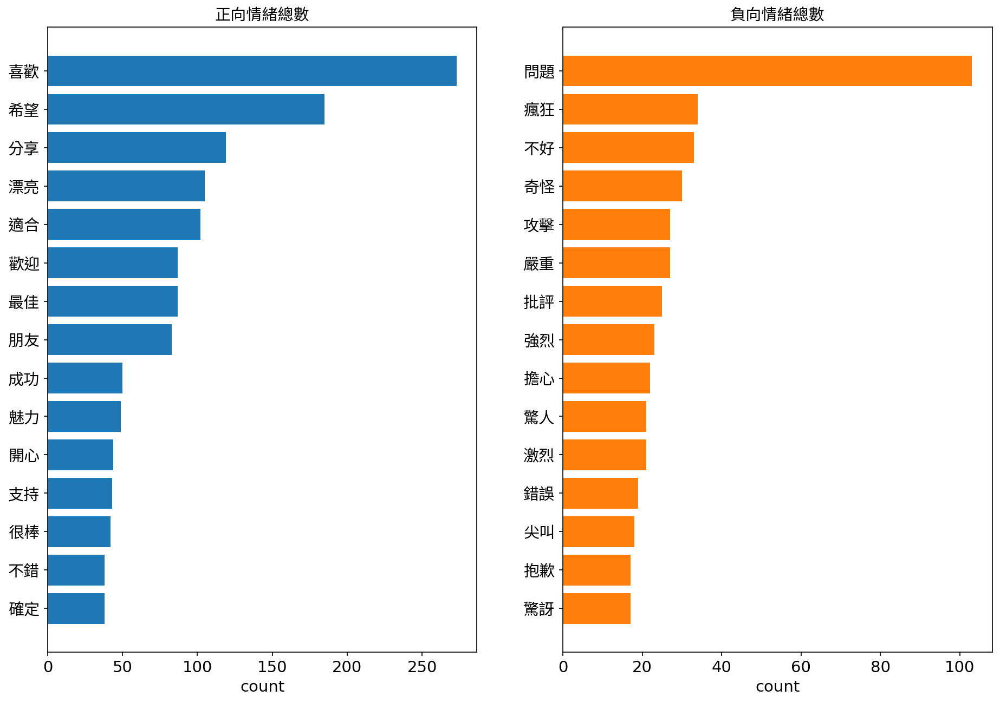

In [ ]:
pos = word_of_pos.head(15).sort_values(["size"], ascending=True)
neg = word_of_neg.head(15).sort_values(["size"], ascending=True)

fig, ax = plt.subplots(1, 2,figsize = (15,10))

ax[0].barh(pos["word"], pos["size"], color=colors[0])
ax[0].set_xlabel("count")
ax[0].set_yticklabels(pos["word"], fontproperties=fprop)
ax[0].set_title("正向情緒總數", fontproperties=fprop)

ax[1].barh(neg["word"], neg["size"], color=colors[1])
ax[1].set_xlabel("count")
ax[1].set_yticklabels(neg["word"], fontproperties=fprop)
ax[1].set_title("負向情緒總數", fontproperties=fprop)

由以上圖可知比較常出現的正面情緒與負面情緒代表字分別為哪些詞彙(如正面情緒:喜歡、希望等。負面情緒:問題、瘋狂等。)

##(三)NER(實體辨識)

NER又稱作專名識別，是自然語言處理中的一項基礎任務。

命名實體一般指的是文本中具有特定意義或者指代性強的實體，通常包括人名、地名、組織機構名、日期時間、專有名詞等

本小組透過NER來找出相關涉及的名詞與動詞,找出目前大眾關注的焦點人物或事件及相關行為

###1.載入套件

In [ ]:
! pip install ckiptagger
from ckiptagger import data_utils, construct_dictionary, WS, POS, NER
import re
from wordcloud import WordCloud
import pandas as pd
import matplotlib.pyplot as plt
import time
import datetime

In [ ]:
data_utils.download_data_gdown("./")   # 下載ckip model

Downloading...
From (original): https://drive.google.com/uc?id=1efHsY16pxK0lBD2gYCgCTnv1Swstq771
From (redirected): https://drive.google.com/uc?id=1efHsY16pxK0lBD2gYCgCTnv1Swstq771&confirm=t&uuid=764f625a-4645-4ecd-9acb-20d5541b8634
To: /content/data.zip
100%|██████████| 1.88G/1.88G [00:20<00:00, 93.5MB/s]


In [ ]:
# 將三份工具的模型路徑指向我們剛才下載的檔案「data」
ws = WS("./data")
pos = POS("./data")
ner = NER("./data")

/usr/local/lib/python3.10/dist-packages/ckiptagger/model_ws.py:106: UserWarning: `tf.nn.rnn_cell.LSTMCell` is deprecated and will be removed in a future version. This class is equivalent as `tf.keras.layers.LSTMCell`, and will be replaced by that in Tensorflow 2.0.
  cell = tf.compat.v1.nn.rnn_cell.LSTMCell(hidden_d, name=name)
/usr/local/lib/python3.10/dist-packages/ckiptagger/model_pos.py:56: UserWarning: `tf.nn.rnn_cell.LSTMCell` is deprecated and will be removed in a future version. This class is equivalent as `tf.keras.layers.LSTMCell`, and will be replaced by that in Tensorflow 2.0.
  cell = tf.compat.v1.nn.rnn_cell.LSTMCell(hidden_d, name=name)
/usr/local/lib/python3.10/dist-packages/ckiptagger/model_ner.py:57: UserWarning: `tf.nn.rnn_cell.LSTMCell` is deprecated and will be removed in a future version. This class is equivalent as `tf.keras.layers.LSTMCell`, and will be replaced by that in Tensorflow 2.0.
  cell = tf.compat.v1.nn.rnn_cell.LSTMCell(hidden_d, name=name)


In [ ]:
#合併stem_token
aggregated_df = dcard_df_2.groupby(dcard_df_2.index)['word'].apply(lambda x: ' '.join(x)).reset_index(name='sentence')
aggregated_df

,index,sentence
0,0,YOASOBI 表演 伴舞 陣容 太豪華 陣容 ano 橋本 環奈 櫻坂 46 JO1 St...
1,1,原文 SSERAFIM SEVENTEEN StrayKids MISAMO 韓評 利用 P...
2,2,年末 想要 分享 Pop 歌曲 私選 排名 部分 純屬 pick 一首歌 喜歡 評選 標準 ...
3,3,回顧 2022 演藝圈 重大事件 回顧 公開 情侶 IU 李鐘 元旦 情侶 李到 林智妍 黑...
4,4,春節 將來 分享 一款 使用 偶像 照片 包袋 APP 這款 app 美相機 app 裡面 ...
...,...,...
767,784,剛剛 人生 第一次 搶票 搶到 NMIXX 挑選 位置 手機 點秀抖 想要 小看 哪裡 位子...
768,785,巧合 想緊 時事順 自清 近期 ILLIT LESSERAFIM 現場 歌唱 實力 引發 軒...
769,786,篇文 刪除 一次 哪裡 人身 攻擊 伸手 文了 ILLIT 有無要 打歌 25 希望 好心人...
770,787,清涼 女兒 ILLIT 沅禧 來源 適合 廣告 不愧 HYBE 適合 寶礦力 水得 青春 學...


In [ ]:
#重新建立索引
clear_df = clear_df.reset_index()
clear_df

,index,artDate,artTitle,gender,sentence
0,0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...
1,1,2023-12-31,#分享 🇯🇵 𝐍𝐇𝐊 紅白歌唱大賽 𝐘𝐎𝐀𝐒𝐎𝐁𝐈 和 𝐊-𝐏𝐎𝐏 愛豆特別合作舞台｜𝘁𝗵𝗲...,F,💫𝘁𝗵𝗲𝗾𝗼𝗼𝗛𝗢𝗧💥。❶，原文：，SSERAFIM、SEVENTEEN、StrayKids...
2,2,2023-12-31,#閒聊 20首2023年度K-Pop歌曲私選,M,，來到年末，想要跟大家分享一下自己年度的K-Pop歌曲私選，排名的部分純屬個人pick，但每...
3,3,2023-12-31,#分享 2023韓國演藝圈重大事件回顧,M,［回顧2022年］，韓國演藝圈重大事件回顧］。。•2023年公開的情侶👫。1.IU、李鐘碩（...
4,4,2023-12-30,#分享 免費DIY 2024偶像紅包袋,F,農曆春節即將來臨，想跟大家分享一款可以使用偶像照片製作紅包袋的APP～，這款app是玩美相機...
...,...,...,...,...,...
782,784,2024-04-20,#詢問 #詢問 TICC 4樓 b4排包廂區視野,F,就在剛剛人生第一次搶票，搶到了一直很想看的NMIXX，但在挑選位置的時候，手機有點秀抖，我想...
783,785,2024-04-20,#分享 近期四代女團的火力(歌喉)展示！,M,可能是巧合，也可能是公司想緊跟時事順便自清？因為近期ILLIT和LESSERAFIM的現場歌...
784,786,2024-04-20,#詢問 ILLIT要打歌到6/25是真的嗎？,F,因為2篇文都被刪除，所以我再發一次喔。。。，我是不知道我是哪裡踩一捧一、人身攻擊、發伸手文了...
785,787,2024-04-20,#分享 韓網HOT🔥寶礦力水得新廣告代言人提示,F,#清涼#忙內女兒。據說是ILLIT的沅禧。來源:theqoo ，很適合耶。2.哇，她這麼快就...


In [ ]:
#定義函數
def Segmentation_Core(data, tokenizer):
    # 將所有的斷行字元配上 escape 以防失效
    regexPattern = '|'.join(map(re.escape, tokenizer))
    output_list = re.split(regexPattern, data)
    # 過濾空白行
    output_list = list(filter(None, output_list))
    return output_list

def Sentence_Segmentation(article, keep_digits=False, keep_alphabets=False):
    """ Sentence_Segmentation function 用於執行中文斷行任務

    順序如下：
    1. 去除(\\n)
    2. 去除特殊符號字元
    3. 保留數字
    4. 依照斷句字元進行斷句全形的分號、逗號、句號、問號以及驚嘆號
    5. 避免空白斷句結果

    Args:
        article(string): 欲斷行之文章內容
        keep_digits(Boolean): 決定是否保留數字於斷行後的結果
        keep_alphabets(Boolean): 決定是否保留字母於斷行後的結果
    Returns:
        List [] 每個 element 就是一行
    """
    sepical_symbols = r'[.＂<>:《》+\-=#$%&()*@＃＄％＆＇\(\)\[\]\{\}（）＊＋－／：\
    ＜＝＞＠［＼］＾＿｀｛｜｝～｟｠｢｣､、〃》「」『』【】〔〕〖〗〘〙〚〛〜〝〞〟〰〾〿–—一‘’‛“”„‟…‧﹏★→─]+'
    segmentation_used_note = (";", "；", "！", "!", "？", "?", "。")


    paragraphs = list(filter(lambda x: re.sub(r'\s+','', x), article.split("\n")))
    # print(len(paragraphs))
    # print(paragraphs)

    result = []
    for paragraph in paragraphs:

        clean_paragraph = paragraph
        try:
            if not keep_digits:
                clean_paragraph = re.sub(r'\d*\.?\d+','', clean_paragraph) #remove space & digits
            if not keep_alphabets:
                clean_paragraph = re.sub('[a-zA-Z]+', '', clean_paragraph)

            clean_paragraph = re.sub(r'[\s]+','', clean_paragraph) #remove space

            clean_paragraph = re.sub(sepical_symbols,'',clean_paragraph)

        except:
            return "error"

        res = Segmentation_Core(clean_paragraph, segmentation_used_note)
        result.append(res)

    return result

In [ ]:
def get_pos(post_id, word_sentence, pos_sentence):
    tokens = []
    # print("\nPOS: ", end="\u3000")
    assert len(word_sentence) == len(pos_sentence)
    for word, pos in zip(word_sentence, pos_sentence): # token level
        tokens.append([post_id, word, pos])
    # print(f"{word}({pos})", end="\u3000")
    return tokens

def get_ner(post_id, entity_sentence):
    entities = []
    # print("\nNER:___________ ")
    for entity in sorted(entity_sentence): # token level
        entities.append([post_id, entity[3], entity[2]])
    return entities

def get_nlp_result(data_df):
    start = time.time()

    pos_list = []
    entity_list = []
    sentence_list = []

    # 遍歷 dataframe 的每筆資料
    for index, row in data_df.iterrows(): # document level
    # print(f"\ndocument {index}")

        # 資料清理 ＆ 斷句
        tmp = Sentence_Segmentation(row['sentence'])
        flat_list = [item for sublist in tmp for item in sublist]

        # ckip
        #word_sentence_list = ws(flat_list, coerce_dictionary = dictionary2)
        word_sentence_list = ws(flat_list)
        pos_sentence_list = pos(word_sentence_list)
        entity_sentence_list = ner(word_sentence_list, pos_sentence_list)

        # 遍歷該 document 中的每一個句子
        for i, sentence in enumerate(flat_list):
            # print(f"sentence {i}: {sentence}")
            sentence_list.append([row['index'], sentence])
            temp_tokens = get_pos(row['index'], word_sentence_list[i], pos_sentence_list[i])
            temp_entites = get_ner(row['index'], entity_sentence_list[i])

            pos_list.append(temp_tokens)
            if len(temp_entites) != 0:
                entity_list.append(temp_entites)

    pos_flat = [item for sublist in pos_list for item in sublist]
    entity_flat = [item for sublist in entity_list for item in sublist]

    pos_table = pd.DataFrame(data=pos_flat,
                    columns=['index','word','pos'])

    entity_table = pd.DataFrame(data=entity_flat,
                    columns=['index','word','ner'])

    sentence_table = pd.DataFrame(data=sentence_list,
                    columns=['index','sentence'])


    end = time.time()
    print("time costing: {}".format(end - start))

    return pos_table, entity_table, sentence_table

In [ ]:
#生成實體辨識等相關資料
pos_table, entity_table, sentence_table = get_nlp_result(aggregated_df)

In [ ]:
pos_table.head() # word pos 列表

,index,word,pos
0,0,表演,VC
1,0,伴舞,VA
2,0,陣容,Na
3,0,太,Dfa
4,0,豪華,VH


In [ ]:
entity_table.head() # word entity 列表

,index,word,ner
0,1,齊愛豆,PERSON
1,1,日本,GPE
2,1,日本,GPE
3,1,年末,DATE
4,1,日本,GPE


In [ ]:
sentence_table.head() # word sentence 列表

,index,sentence
0,0,表演伴舞陣容太豪華陣容橋本環奈櫻坂乃木坂開心天韓團出現同個舞這感覺神奇次元破壁找來這首歌伴舞...
1,1,原文韓評利用愛豆真是用心險惡愛豆當愛豆伴舞出席紅白歌唱大賽愛豆全員齊愛豆利用陣容當別紅白歌唱...
2,2,年末想要分享歌曲私選排名部分純屬首歌喜歡評選標準歌曲行期間介之間歌曲性質設定進行宣傳主打拍攝...
3,3,回顧演藝圈重大事件回顧公開情侶李鐘元旦情侶李到林智妍黑暗榮耀安普賢分手藝人離世成員文彬離世李...
4,4,春節將來分享款使用偶像照片包袋這款美相機裡面包袋功能偶像照片放在包袋印出收藏送給追星朋友推薦...


In [ ]:
# 檢查筆數
print(f"total posts numbers: {len(pos_table['index'].unique())}") # 766篇文
print(f"posts have NER: {len(entity_table['index'].unique())}") #598篇文

total posts numbers: 766
posts have NER: 600


In [ ]:
# 將文章存成csv
pos_table.to_csv('/content/drive/MyDrive/中山大學/社群媒體/project_pos_table_udn.csv', index = False)
entity_table.to_csv('/content/drive/MyDrive/中山大學/社群媒體/project_entity_table_udn.csv', index = False)
sentence_table.to_csv('/content/drive/MyDrive/中山大學/社群媒體/project_sentence_table_udn.csv', index = False)

In [ ]:
# 讀取已經執行完畢的結果
pos_table = pd.read_csv("pos_table_udn.csv")
entity_table = pd.read_csv("entity_table_udn.csv")

###2.涉及到的名詞(Noun)
###我們可以找出談論大部分討論到的名詞，探索大家的關注焦點。

篩選出的人名，可以得知這段期間大家討論度最高的藝人為誰。

In [ ]:
# 篩選pos為專有名詞的資料
l_noun = ["Nb"] #,"Na"
noun = pos_table[pos_table.pos.isin(l_noun)]

# 計算每個名詞提到的次數，選出前15個
noun_count = noun[['word']].groupby(['word'])['word'].count().reset_index(name='count').sort_values(['count'], ascending=False).head(15)
noun_count.head(10)

,word,count
49,俊昊,141
981,閔熙珍,132
214,太妍,41
346,張員瑛,40
398,惠仁,26
497,李俊昊,24
167,員瑛,22
218,夫碩順,21
287,寧寧,16
930,采源,15


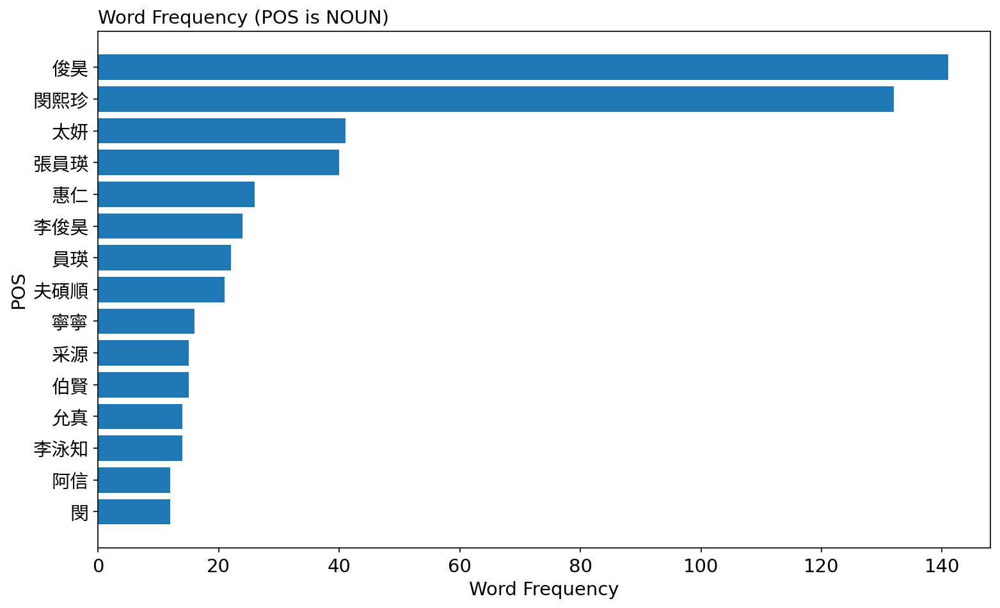

In [ ]:
# 設定中文字形
plt.rcParams['font.sans-serif'] = ['Arial Unicode Ms']
word = noun_count['word']
count = noun_count['count']

fig, ax = plt.subplots(figsize =(12, 7))
ax.barh(word, count)
ax.invert_yaxis()

# 設置字體
for label in ax.get_yticklabels():
    label.set_fontproperties(fprop)

ax.set_title('Word Frequency (POS is NOUN)',loc ='left', size = 14)
ax.set_ylabel('POS', size = 14)
ax.set_xlabel('Word Frequency', size = 14)
fig.show()

###3.涉及到的動詞(VERB)
###我們可以找出談論大部分討論到的動詞，探索相關行為。

In [ ]:
l_verb = ["VC"] # ,"VH","VA"
verb = pos_table[pos_table.pos.isin(l_verb)] # 選取特定詞性
verb = verb[verb['word'].map(len) > 1] # 把長度為1的字去除掉

verb_count = verb[['word']].groupby(['word'])['word'].count().reset_index(name='count').sort_values(['count'], ascending=False).head(15)
verb_count

,word,count
819,發行,157
9,主打,131
734,演唱,112
979,表演,109
1156,進行,93
1117,轉載,79
515,推薦,68
733,演出,67
507,推出,62
152,參加,54


從圖表可以看出網友討論韓團的活動動向主要為發行新歌及表演為主。

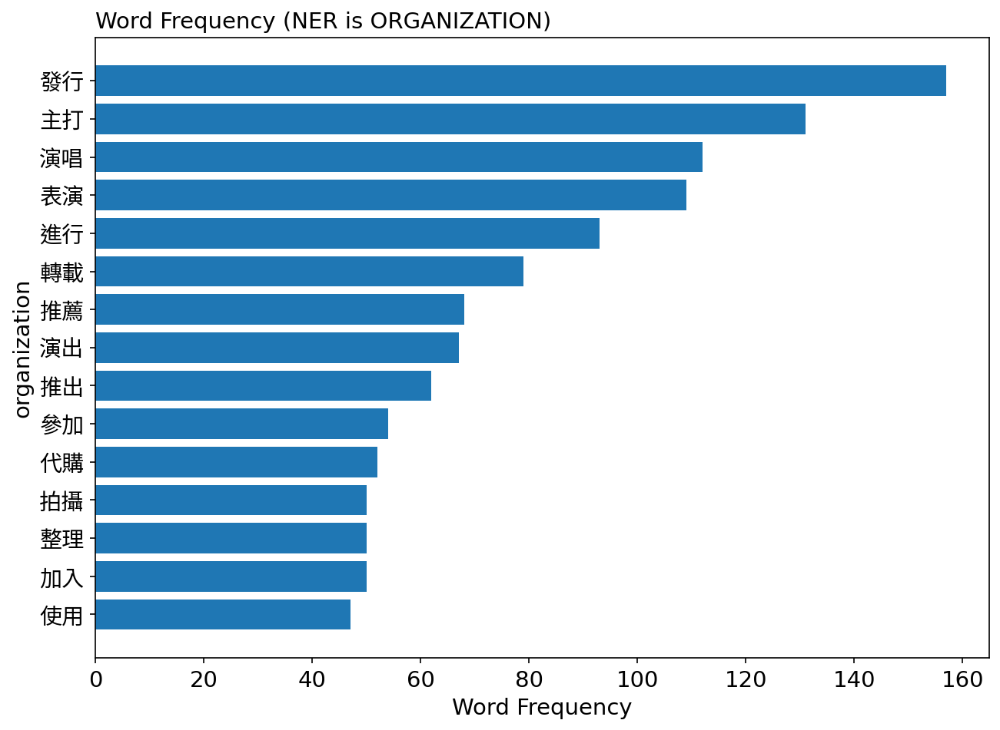

In [ ]:
plt.rcParams['font.sans-serif'] = ['Arial Unicode Ms']
word = verb_count['word']
count = verb_count['count']

fig, ax = plt.subplots(figsize =(10, 7))
ax.barh(word, count)
ax.invert_yaxis()

# 設置字體
for label in ax.get_yticklabels():
    label.set_fontproperties(fprop)

ax.set_title('Word Frequency (NER is ORGANIZATION)',loc ='left', size = 14)
ax.set_ylabel('organization', size = 14)
ax.set_xlabel('Word Frequency', size = 14)
fig.show()

##(四)TF-IDF

TF-IDF 是一種統計方法，可用來評估單詞對於文件的集合的重要程度

TF (Term Frequency)：某一個詞彙在某一個文件中所出現的頻率
TF = 詞彙在該文件中出現次數 / 該文件中詞彙總數
IDF (Inverse Document Frequent)：為文件數除以某特定詞彙有被多少文件所提及的數量取log
IDF = log( 總文件數量 / 包含該詞彙的文件數量 )

In [ ]:
dcard_df_2 = dcard_df_2.reset_index()
dcard_df_2

,index,artDate,artTitle,gender,sentence,word
0,0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,YOASOBI
1,0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,表演
2,0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,伴舞
3,0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,陣容
4,0,2023-12-31,#閒聊 日本紅白 夢幻聯動,M,最後YOASOBI表演アイドル時的伴舞陣容也太豪華！！。陣容：ano、橋本環奈、櫻坂46、J...,太豪華
...,...,...,...,...,...,...
69112,788,2024-04-20,#閒聊 追星前vs.追星後？,F,突然想到的問題，大家有什麼變化呢？。我自己是👇，-，-，-，追星前：花美男+長髮嗯……ಠ_ಠ...,違規
69113,788,2024-04-20,#閒聊 追星前vs.追星後？,F,突然想到的問題，大家有什麼變化呢？。我自己是👇，-，-，-，追星前：花美男+長髮嗯……ಠ_ಠ...,告知
69114,788,2024-04-20,#閒聊 追星前vs.追星後？,F,突然想到的問題，大家有什麼變化呢？。我自己是👇，-，-，-，追星前：花美男+長髮嗯……ಠ_ಠ...,有錯
69115,788,2024-04-20,#閒聊 追星前vs.追星後？,F,突然想到的問題，大家有什麼變化呢？。我自己是👇，-，-，-，追星前：花美男+長髮嗯……ಠ_ಠ...,告知


In [ ]:
#計算各日期新聞的總詞彙數
total_words = dcard_df_2.groupby(['artDate'], as_index=False).size().rename(columns={'size': 'total'})
total_words.head()

,artDate,total
0,2023-10-01,77
1,2023-10-02,115
2,2023-10-03,77
3,2023-10-05,219
4,2023-10-06,674


In [ ]:
#計算熱門詞彙出現次數
word_count = dcard_df_2.groupby(['artDate', 'word'], as_index = False).size()

word_count.rename(columns={'size': 'count'}, inplace=True)
word_count.sort_values('count', ascending=False).head()

,artDate,word,count
4200,2023-10-21,俊昊,88
47050,2024-05-13,NewJeans,51
18992,2023-12-26,NewJeans,49
41861,2024-04-26,HYBE,40
47023,2024-05-13,HYBE,36


In [ ]:
word_count

,artDate,word,count
0,2023-10-01,.....,1
1,2023-10-01,2008,1
2,2023-10-01,Felix,5
3,2023-10-01,LV,1
4,2023-10-01,NewJeans,1
...,...,...,...
49560,2024-05-19,這兩位,1
49561,2024-05-19,遙遠,1
49562,2024-05-19,閔熙,1
49563,2024-05-19,閔熙珍,3


In [ ]:
#將word_count與total_words的dataframe合併
word_merged = word_count.merge(total_words, on = 'artDate', how = 'left')
word_merged.head(100)

,artDate,word,count,total
0,2023-10-01,.....,1,77
1,2023-10-01,2008,1,77
2,2023-10-01,Felix,5,77
3,2023-10-01,LV,1,77
4,2023-10-01,NewJeans,1,77
...,...,...,...,...
95,2023-10-02,文化,1,115
96,2023-10-02,更受,1,115
97,2023-10-02,更廣泛,1,115
98,2023-10-02,最紅,1,115


In [ ]:
# 計算tf = 詞彙在該文件中出現次數 / 該文件中詞彙總數
word_tf_idf = word_merged.assign(tf = word_merged["count"] / word_merged["total"])
word_tf_idf.head()

,artDate,word,count,total,tf
0,2023-10-01,.....,1,77,0.012987
1,2023-10-01,2008,1,77,0.012987
2,2023-10-01,Felix,5,77,0.064935
3,2023-10-01,LV,1,77,0.012987
4,2023-10-01,NewJeans,1,77,0.012987


In [ ]:
# 計算每個詞彙出現在幾篇文章中
idf_df = word_merged.groupby(['word'], as_index = False).size()

# 合併到之前的df中
word_tf_idf = word_tf_idf.merge(idf_df, on = 'word', how = 'left')

word_tf_idf.head()

,artDate,word,count,total,tf,size
0,2023-10-01,.....,1,77,0.012987,8
1,2023-10-01,2008,1,77,0.012987,4
2,2023-10-01,Felix,5,77,0.064935,6
3,2023-10-01,LV,1,77,0.012987,4
4,2023-10-01,NewJeans,1,77,0.012987,137


In [ ]:
# 計算idf = log( 總文件數量 / 包含該詞彙的文件數量 )
import math
word_tf_idf = word_tf_idf.assign(idf = word_tf_idf["size"].apply(lambda size: math.log( len(total_words) / size, 10 ))).drop(["size"], axis=1)

word_tf_idf.head()

,artDate,word,count,total,tf,idf
0,2023-10-01,.....,1,77,0.012987,1.435367
1,2023-10-01,2008,1,77,0.012987,1.736397
2,2023-10-01,Felix,5,77,0.064935,1.560305
3,2023-10-01,LV,1,77,0.012987,1.736397
4,2023-10-01,NewJeans,1,77,0.012987,0.201736


In [ ]:
#計算 TFIDF值
# 計算tf*idf
word_tf_idf = word_tf_idf.assign(tf_idf = word_tf_idf["tf"] * word_tf_idf["idf"])

word_tf_idf.sort_values('tf_idf', ascending = False).head(10)

,artDate,word,count,total,tf,idf,tf_idf
36556,2024-04-09,CD,1,2,0.500000,1.861335,0.930668
6535,2023-10-28,解答,1,2,0.500000,1.338456,0.669228
29299,2024-03-05,取景,1,4,0.250000,1.861335,0.465334
23748,2024-01-23,描小卡,1,6,0.166667,2.338456,0.389743
23743,2024-01-23,EVOLution,1,6,0.166667,2.338456,0.389743
36557,2024-04-09,孩子,1,2,0.500000,0.747392,0.373696
23745,2024-01-23,Punch,1,6,0.166667,2.037426,0.339571
29301,2024-03-05,熟悉,1,4,0.250000,1.338456,0.334614
29300,2024-03-05,滿滿,1,4,0.250000,1.338456,0.334614
24449,2024-01-30,媽媽,2,11,0.181818,1.560305,0.283692


In [ ]:
# 選出每個日期，tf-idf值最大的前三個詞
group = word_tf_idf.groupby("artDate").apply(lambda x : x.nlargest(3, "tf_idf"))
group

artDate       word  count  total        tf       idf  \
artDate                                                                    
2023-10-01 26    2023-10-01         惠仁      9     77  0.116883  1.192328   
           2     2023-10-01      Felix      5     77  0.064935  1.560305   
           7     2023-10-01         三位      3     77  0.038961  1.639486   
2023-10-02 65    2023-10-02  NextLevel      9    115  0.078261  2.338456   
           63    2023-10-02   LoveDive      6    115  0.052174  1.861335   
...                     ...        ...    ...    ...       ...       ...   
2024-05-18 49357 2024-05-18         政府      5    302  0.016556  2.037426   
           49361 2024-05-18         方針      5    302  0.016556  2.037426   
2024-05-19 49543 2024-05-19         演戲      5    125  0.040000  1.736397   
           49480 2024-05-19       HYBE      8    125  0.064000  0.675699   
           49501 2024-05-19         冷凍      2    125  0.016000  2.338456   

                    tf_idf  
artDate                     
2023-10-01 26     0.139363  
           2      0.101319  
           7      0.063876  
2023-10-02 65     0.183010  
           63     0.097113  
...                    ...  
2024-05-18 49357  0.033732  
           49361  0.033732  
2024-05-19 49543  0.069456  
           49480  0.043245  
           49501  0.037415  

[652 rows x 7 columns]

通過計算詞語的TF-IDF值, 我們可以得到一個詞語在特定文本中的重要性分數，進而進行特徵表示、相似度計算和DTM等操作。

##(五)DTM
Document term matrix (DTM)，是一種用於自然語言處理的數學矩陣，描述了在一組文件中各個詞彙出現的頻率。

DTM 中的每一行代表一個文件(Document)，每一列代表一個詞彙(Term)，每一格的值表示該詞彙在該文件中的出現次數。

In [ ]:
dtm_clear_df = aggregated_df.copy()
dtm_clear_df.head()

,index,sentence
0,0,YOASOBI 表演 伴舞 陣容 太豪華 陣容 ano 橋本 環奈 櫻坂 46 JO1 St...
1,1,原文 SSERAFIM SEVENTEEN StrayKids MISAMO 韓評 利用 P...
2,2,年末 想要 分享 Pop 歌曲 私選 排名 部分 純屬 pick 一首歌 喜歡 評選 標準 ...
3,3,回顧 2022 演藝圈 重大事件 回顧 公開 情侶 IU 李鐘 元旦 情侶 李到 林智妍 黑...
4,4,春節 將來 分享 一款 使用 偶像 照片 包袋 APP 這款 app 美相機 app 裡面 ...


In [ ]:
# Bag of Word
import networkx as nx
from sklearn.feature_extraction.text import CountVectorizer,TfidfTransformer
from sklearn.metrics.pairwise import cosine_similarity
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(aggregated_df["sentence"])
vocabulary = vectorizer.get_feature_names_out()

# 轉成 dataframe
DTM_df = pd.DataFrame(columns = vocabulary, data = X.toarray())
DTM_df

,00,000,008,00mv,00p,01,0101,011,015,018,...,鼠王,鼻子,鼻子走,鼻酸,齊全,齊放,齊驅,龍爭,龍馥,龐大
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
767,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
768,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
769,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
770,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
transformer = TfidfTransformer()
# 將詞頻矩陣X統計成TF-IDF值
tfidf = transformer.fit_transform(X)

# 轉成dataframe
TFIDF_df = pd.DataFrame(columns = vocabulary, data = tfidf.toarray())

TFIDF_df

,00,000,008,00mv,00p,01,0101,011,015,018,...,鼠王,鼻子,鼻子走,鼻酸,齊全,齊放,齊驅,龍爭,龍馥,龐大
0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.149227,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
767,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
768,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
769,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
770,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


根據tfidf值來挑出重要詞彙的方法有許多種，以下舉兩個方法當範例：

取每一個字詞在所有文件裡的TF-IDF平均值
取每份文件裡TF-IDF值最大的前10個字詞當為常用字詞，再取每一個字詞在常用字詞中出現頻率

###1.方法1： 取每一個字詞在所有文件裡的TF-IDF平均值

這邊可以看出本研究的代表關鍵字NewJeans,IVE,aespa,LESSERAFIM,NMIXX,ILLIT六個女團的討論頻率，可以看出台灣人十分喜歡NewJeans。同時可以知道網友主要討論這些女團的歌曲、專輯及舞台。

In [ ]:
dcard_tfidf = TFIDF_df.mean().to_frame().reset_index()
dcard_tfidf.columns = ["word", "avg"]

dcard_tfidf.sort_values('avg', ascending = False).head(10)

,word,avg
2592,newjeans,0.027560
2017,ive,0.020698
852,aespa,0.018008
12066,歌曲,0.017517
1904,hybe,0.015903
8584,專輯,0.015704
7096,喜歡,0.014266
1938,illit,0.013430
2629,nmixx,0.013021
15492,舞台,0.012128


###2.方法2： 取每份文件裡TF-IDF值最大的前10個字詞當為常用字詞，再取每一個字詞在常用字詞中出現頻率。

In [ ]:
toptens = TFIDF_df.copy()
toptens.insert(0, 'doc_id', toptens.index+1)

toptens

,doc_id,00,000,008,00mv,00p,01,0101,011,015,...,鼠王,鼻子,鼻子走,鼻酸,齊全,齊放,齊驅,龍爭,龍馥,龐大
0,1,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3,0.0,0.0,0.0,0.0,0.0,0.149227,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
767,768,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
768,769,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
769,770,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
770,771,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
toptens = toptens.melt(id_vars = "doc_id", var_name = "word", value_name = 'tfidf')
toptens

,doc_id,word,tfidf
0,1,00,0.0
1,2,00,0.0
2,3,00,0.0
3,4,00,0.0
4,5,00,0.0
...,...,...,...
14718175,768,龐大,0.0
14718176,769,龐大,0.0
14718177,770,龐大,0.0
14718178,771,龐大,0.0


In [ ]:
#nlargest() 會回傳指定列中最大的前x個值所對應的資料

(
    # 從每篇文章挑選出tf-idf最大的前十個詞
    toptens.groupby("doc_id").apply(lambda x : x.nlargest(10, "tfidf")).reset_index(drop=True)

    # 計算每個詞被選中的次數
    .groupby(['word'],as_index=False).size()

).sort_values('size', ascending=False).head(10) # 排序看前十名

,word,size
0,00,80
1,000,61
2,008,51
3,00mv,45
763,newjeans,43
4,00p,35
541,hybe,32
5,01,30
3507,歌曲,29
2611,專輯,25


從上述結果可看出方法一的結果較佳。

##(六)使用Ngram

###1.Bigram

In [ ]:
# 設定 ngram 斷詞 function
def ngram_getToken(row, n):
    # 進行斷詞
    seg_list = jieba.lcut(row)

    # 篩選掉停用字與字元數小於1的詞彙
    seg_list = [w for w in seg_list if w not in stopWords and len(w)>1]

    # ngram斷詞
    seg_list = ngrams(seg_list, n)
    seg_list = [" ".join(w) for w in list(seg_list)]

    return seg_list

In [ ]:
from nltk import ngrams, FreqDist
clear_df_bigram = aggregated_df.copy()

clear_df_bigram["word"] = clear_df_bigram['sentence'].apply(lambda row: ngram_getToken(row, 2))
clear_df_bigram = clear_df_bigram.explode('word')

clear_df_bigram.head(3)

,index,sentence,word
0,0,YOASOBI 表演 伴舞 陣容 太豪華 陣容 ano 橋本 環奈 櫻坂 46 JO1 St...,YOASOBI 表演
0,0,YOASOBI 表演 伴舞 陣容 太豪華 陣容 ano 橋本 環奈 櫻坂 46 JO1 St...,表演 伴舞
0,0,YOASOBI 表演 伴舞 陣容 太豪華 陣容 ano 橋本 環奈 櫻坂 46 JO1 St...,伴舞 陣容


In [ ]:
# 計算每個組合出現的次數
clear_df_bigram_count = clear_df_bigram['word'].value_counts().reset_index()

clear_df_bigram_count.sort_values('count', ascending=False).head(20)

,word,count
0,正規 一輯,38
1,防彈 少年,36
2,發行 主打,35
3,專輯 銷量,33
4,轉載 評論,33
5,頒獎 典禮,30
6,UNFORG IVE,25
7,工作 人員,24
8,迷你 專輯,21
9,NewJeans Ditto,19


###2.第二次Bigram

從上面的 bigram的結果中，所以我們增加自定義字典['防彈少年','正規一輯','專輯銷量','轉載評論','頒獎典禮','UNFORGIVEN','UNFORGIVE','工作人員','迷你專輯','ILLIT','品牌大使','IZONE','宇宙少女','東方神起','觀看次數']來幫助斷詞能更準確。

In [ ]:
# 參數形式手動將字詞加入斷詞字典
words = ['最後','SM','JYPE','HYBE','YG','CUBE','IVE','aespa','NewJeans','NMIXX','LESSERAFIM','拍攝','StrayKids','NCTDREAM','RedVelvet','少女時代','BLACKPINK','BOYNEXTDOOR','(G)-IDLE','李俊昊',
         '防彈少年','正規一輯','專輯銷量','轉載評論','頒獎典禮','UNFORGIVEN','UNFORGIVE','工作人員','迷你專輯','ILLIT','品牌大使','IZONE','宇宙少女','東方神起','觀看次數']
for w in words:
    jieba.add_word(w, freq=None, tag=None)

In [ ]:
#移除句子中的空格
aggregated_df['sentence'] = aggregated_df['sentence'].str.replace(" ", "")

In [ ]:
aggregated_token_df = aggregated_df.assign(word = aggregated_df['sentence'].apply(jieba.lcut)).explode('word')
aggregated_token_df.head(10)

,index,sentence,word
0,0,YOASOBI表演伴舞陣容太豪華陣容ano橋本環奈櫻坂46JO1StrayKidsSEVEN...,YOASOBI
0,0,YOASOBI表演伴舞陣容太豪華陣容ano橋本環奈櫻坂46JO1StrayKidsSEVEN...,表演
0,0,YOASOBI表演伴舞陣容太豪華陣容ano橋本環奈櫻坂46JO1StrayKidsSEVEN...,伴舞
0,0,YOASOBI表演伴舞陣容太豪華陣容ano橋本環奈櫻坂46JO1StrayKidsSEVEN...,陣容
0,0,YOASOBI表演伴舞陣容太豪華陣容ano橋本環奈櫻坂46JO1StrayKidsSEVEN...,太
0,0,YOASOBI表演伴舞陣容太豪華陣容ano橋本環奈櫻坂46JO1StrayKidsSEVEN...,豪華
0,0,YOASOBI表演伴舞陣容太豪華陣容ano橋本環奈櫻坂46JO1StrayKidsSEVEN...,陣容
0,0,YOASOBI表演伴舞陣容太豪華陣容ano橋本環奈櫻坂46JO1StrayKidsSEVEN...,ano
0,0,YOASOBI表演伴舞陣容太豪華陣容ano橋本環奈櫻坂46JO1StrayKidsSEVEN...,橋本
0,0,YOASOBI表演伴舞陣容太豪華陣容ano橋本環奈櫻坂46JO1StrayKidsSEVEN...,環奈


In [ ]:
#合併stem_token
aggregated_df_2 = aggregated_token_df.groupby(aggregated_token_df.index)['word'].apply(lambda x: ' '.join(x)).reset_index(name='sentence')
aggregated_df_2

,index,sentence
0,0,YOASOBI 表演 伴舞 陣容 太 豪華 陣容 ano 橋本 環奈 櫻坂 46JO1 St...
1,1,原文 SSERAFIMSEVENTEEN StrayKids MISAMO 韓評 利用 PO...
2,2,年末 想要 分享 Pop 歌曲 私選 排名 部分 純屬 pick 一首歌 喜歡 評選 標準 ...
3,3,回顧 2022 演藝圈 重大事件 回顧 公開 情侶 IU 李鐘 元旦 情侶 李到 林智妍 黑...
4,4,春節 將來 分享 一款 使用 偶像 照片 包袋 APP 這款 app 美 相機 app 裡 ...
...,...,...
767,767,剛剛 人生 第一次 搶票 搶 到 NMIXX 挑選 位置 手機 點秀抖 想要 小看 哪裡 位...
768,768,巧合 想緊 時事 順自清 近期 ILLIT LESSERAFIM 現場 歌唱 實力 引發 軒...
769,769,篇文 刪除 一次 哪裡 人身攻擊 伸手 文了 ILLIT 有無 要 打歌 25 希望 好心人...
770,770,清涼 女兒 ILLIT 沅禧 來源 適合 廣告 不愧 HYBE 適合 寶礦力 水得 青春 學...


In [ ]:
from nltk import ngrams, FreqDist
clear_df_bigram_2 = aggregated_df_2.copy()

clear_df_bigram_2["word"] = clear_df_bigram_2['sentence'].apply(lambda row: ngram_getToken(row, 2))
clear_df_bigram_2 = clear_df_bigram_2.explode('word')

clear_df_bigram_2.head(3)

,index,sentence,word
0,0,YOASOBI 表演 伴舞 陣容 太 豪華 陣容 ano 橋本 環奈 櫻坂 46JO1 St...,YOASOBI 表演
0,0,YOASOBI 表演 伴舞 陣容 太 豪華 陣容 ano 橋本 環奈 櫻坂 46JO1 St...,表演 伴舞
0,0,YOASOBI 表演 伴舞 陣容 太 豪華 陣容 ano 橋本 環奈 櫻坂 46JO1 St...,伴舞 陣容


In [ ]:
# 計算每個組合出現的次數
clear_df_bigram_count_2 = clear_df_bigram_2['word'].value_counts().reset_index()

clear_df_bigram_count_2.sort_values('count', ascending=False).head(20)

,word,count
0,發行 主打,35
1,發行 專輯,17
2,偶像 團體,16
3,日本 人氣,16
4,LESSERAFIM UNFORGIVE,15
10,發行 初動,14
9,萬張 中輸,14
7,使用 專輯銷量,14
6,女子 組合,14
5,aespa IVE,14


###3.Trigram

再看看Trigram有沒有特別的結果可放入自定義字典

In [ ]:
clear_df_trigram = aggregated_df_2.copy()

clear_df_trigram["word"] = clear_df_trigram.sentence.apply(lambda row: ngram_getToken(row, 3))
clear_df_trigram = clear_df_trigram.explode('word')

clear_df_trigram.head(3)

,index,sentence,word
0,0,YOASOBI 表演 伴舞 陣容 太 豪華 陣容 ano 橋本 環奈 櫻坂 46JO1 St...,YOASOBI 表演 伴舞
0,0,YOASOBI 表演 伴舞 陣容 太 豪華 陣容 ano 橋本 環奈 櫻坂 46JO1 St...,表演 伴舞 陣容
0,0,YOASOBI 表演 伴舞 陣容 太 豪華 陣容 ano 橋本 環奈 櫻坂 46JO1 St...,伴舞 陣容 豪華


得出的結果並無特別，固未增加自定義字典

In [ ]:
# 計算每個組合出現的次數
clear_df_trigram_count = clear_df_trigram['word'].value_counts().reset_index()

clear_df_trigram_count.sort_values('count', ascending=False).head(10)

,word,count
0,提前 使用 專輯銷量,14
1,首爾 歌謠 大賞,10
6,使用 專輯銷量 方式,8
4,音源 60% 評審,8
5,評審 20% 投票,8
3,SM 造獎 爭議,8
2,20% 投票 20%,8
7,60% 評審 20%,8
8,最佳 舞蹈 表演,6
9,看看 這則 貼文,6


##(七)建立Ngram預測模型

In [ ]:
predict_ngram_df = aggregated_df_2.copy()
sen_tokens = predict_ngram_df.sentence.apply(getToken).tolist()

In [ ]:
#建立函數
def ngram(documents, N=2):
    ngram_prediction = dict()
    total_grams = list()
    words = list()
    Word = namedtuple('Word', ['word', 'prob'])

    for doc in documents:
        # 加上開頭和結尾 tag
        split_words = ['<s>'] + list(doc) + ['</s>']
        # 計算分子
        [total_grams.append(tuple(split_words[i:i+N])) for i in range(len(split_words)-N+1)]
        # 計算分母
        [words.append(tuple(split_words[i:i+N-1])) for i in range(len(split_words)-N+2)]

    total_word_counter = Counter(total_grams)
    word_counter = Counter(words)

    for key in total_word_counter:
        word = ''.join(key[:N-1])
        if word not in ngram_prediction:
            ngram_prediction.update({word: set()})

        next_word_prob = total_word_counter[key]/word_counter[key[:N-1]] #P(B|A)
        w = Word(key[-1], '{:.3g}'.format(next_word_prob))
        ngram_prediction[word].add(w)

    return ngram_prediction

In [ ]:
# 此處以Bigram預測模型為例
from nltk import ngrams, FreqDist
from collections import Counter, namedtuple

bi_prediction = ngram(sen_tokens, N=2)

以aespa為例，出現IVE出現的頻率比NewJeans高表示兩團常被拿來討論或比較。

In [ ]:
#預測下一個出現的詞，以"aespa"為例
text = 'aespa'
next_words = list(bi_prediction[text])
next_words.sort(key = lambda s: s[1], reverse = True)
for next_word in next_words[:5]:
    print('next word: {}, probability: {}'.format(next_word.word, next_word.prob))

next word: IVE, probability: 0.0504
next word: Karina, probability: 0.0288
next word: 回歸, probability: 0.0288
next word: NewJeans, probability: 0.0216
next word: Drama, probability: 0.0216


In [ ]:
#預測下一個出現的詞，以'NewJeans'為例
text = 'NewJeans'
next_words = list(bi_prediction[text])
next_words.sort(key = lambda s: s[1], reverse = True)
for next_word in next_words[:5]:
    print('next word: {}, probability: {}'.format(next_word.word, next_word.prob))

next word: NewJeans, probability: 0.0191
next word: IVE, probability: 0.0191
next word: 父母, probability: 0.0191
next word: Ditto, probability: 0.0162
next word: HYBE, probability: 0.0162


##(八)Bigram視覺化

In [ ]:
bigramfdist = clear_df_bigram_2.copy()
bigramfdist['word'] = bigramfdist['word'].astype(str)

# 使用FreqDist 取得 bigram 斷詞 與 bigram出現頻率
bigramfdist = FreqDist(bigramfdist['word'].apply(lambda x: tuple(x.split(' '))))
bigramfdist.most_common(20)

[(('發行', '主打'), 35),
 (('發行', '專輯'), 17),
 (('偶像', '團體'), 16),
 (('日本', '人氣'), 16),
 (('LESSERAFIM', 'UNFORGIVE'), 15),
 (('aespa', 'IVE'), 14),
 (('發行', '初動'), 14),
 (('萬張', '中輸'), 14),
 (('女子', '組合'), 14),
 (('提前', '使用'), 14),
 (('使用', '專輯銷量'), 14),
 (('NewJeans', 'IVE'), 13),
 (('NewJeans', 'NewJeans'), 13),
 (('熱門', '歌曲'), 13),
 (('NewJeans', '父母'), 13),
 (('歌謠', '大戰'), 12),
 (('印象', '深刻'), 12),
 (('特別', '喜歡'), 12),
 (('NewJeans', 'Ditto'), 11),
 (('正規', '專輯'), 11)]

In [ ]:
# 建立bigram和count的dictionary
# 這裡取最多的前50項
d = {k:v for k,v in bigramfdist.most_common(50)}

In [ ]:
# Create network plot
G = nx.Graph()

# 建立 nodes 間的連結
for k, v in [d][0].items():
    G.add_edge(k[0], k[1], weight=v) # nodes：詞彙，weight：組合出現頻率

# 取得edge權重
weights = [w[2]['weight']*0.01 for w in  G.edges(data=True)]

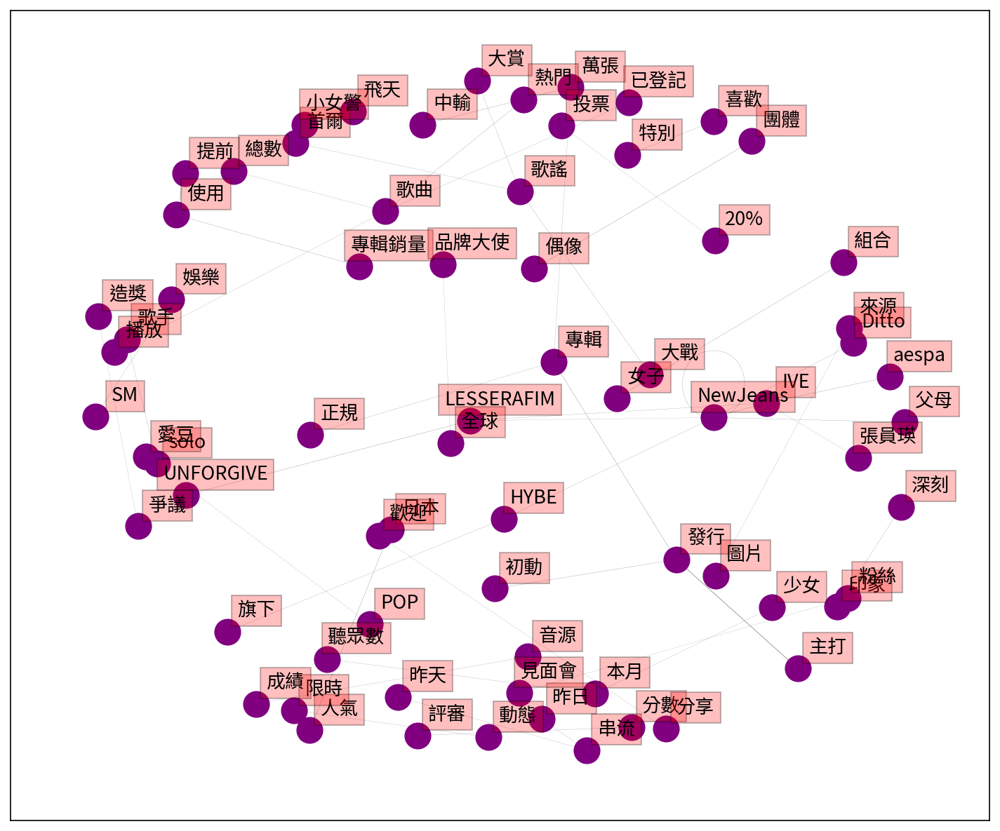

In [ ]:
plt.rcParams['font.sans-serif'] = ['Arial Unicode Ms']
fig, ax = plt.subplots(figsize=(12, 10))

pos = nx.spring_layout(G, k=1.5)


# networks
nx.draw_networkx(G, pos,
                 font_size=16,
                 width=weights,
                 edge_color='grey',
                 node_color='purple',
                 with_labels = False,
                 ax=ax)

# 增加 labels
for key, value in pos.items():
    x, y = value[0]+.07, value[1]+.045
    ax.text(x, y,
            s=key,
            bbox=dict(facecolor='red', alpha=0.25),
            horizontalalignment='center', fontsize=13,fontproperties=fprop)

plt.show()

結論:發行/主打/專輯/投票/萬張可以代表韓國的投票文化。
1. 專輯投票和發行
韓國音樂市場中，粉絲投票對於專輯和歌曲的發行起到了至關重要的作用。許多偶像團體和歌手會通過各種音樂節目、網絡平台進行投票，以確定主打歌或宣傳曲目。這種投票不僅能增加粉絲的參與感，還能直接影響專輯銷量和歌曲的曝光度。

2. 主打歌的選擇
在韓國，主打歌的選擇常常由公司內部決定，但粉絲投票也起到了輔助作用。公司會根據粉絲的投票結果來決定專輯的主打歌曲，從而確保新專輯能夠滿足市場需求和粉絲期待。

3. 音樂節目投票
韓國的音樂節目如《音樂銀行》、《人氣歌謠》、《M Countdown》等，通過粉絲投票來決定每週的冠軍歌曲。這些節目會綜合考慮數字音源成績、專輯銷量、社交媒體熱度、觀眾投票等多種因素，粉絲的積極投票成為偶像獲勝的重要因素。

4. 獨特的投票文化
韓國的粉絲投票文化極具特色，粉絲不僅在網上投票，還會購買大量專輯來增加銷量，從而支持他們喜愛的偶像。在某些情況下，粉絲甚至會購買數千張專輯來確保偶像登頂榜單。這種投票文化促使偶像團體和歌手的專輯銷量達到數萬張甚至更高的數字。

5. 粉絲團體的作用
粉絲團體在韓國的投票文化中扮演著重要角色。他們會組織投票活動、募款購買專輯、在社交媒體上宣傳偶像等，以確保偶像在各種比賽和節目中獲勝。這種組織化和系統化的支持活動使得韓國的投票文化異常活躍和有力。

#五、network
本小組透過Dcard追星版資料集來繪製出人物關聯圖及國家關係圖。

In [ ]:
#安裝network的做圖套件,使用pyvis/networkx套件進行網路圖的繪製實作
#!pip install pyvis

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.0/756.0 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 16.5 MB/s eta 0:00:00


In [ ]:
import pyvis
import IPython
import random

In [ ]:
# 讀取已經執行完畢的結果
pos_table = pd.read_csv("/content/drive/MyDrive/中山大學/社群媒體/project/project_pos_table_udn.csv")
entity_table = pd.read_csv("/content/drive/MyDrive/中山大學/社群媒體/project/project_entity_table_udn.csv")

In [ ]:
entity_table

,index,word,ner
0,1,齊愛豆,PERSON
1,1,日本,GPE
2,1,日本,GPE
3,1,年末,DATE
4,1,日本,GPE
...,...,...,...
4072,787,沅禧,PERSON
4073,787,沅禧,PERSON
4074,788,李龍馥,PERSON
4075,788,金秦禹,PERSON


In [ ]:
#查看標註這個文集後辨識出哪一些實體種類
entity_table['ner'].unique()

array(['PERSON', 'GPE', 'DATE', 'NORP', 'ORDINAL', 'ORG', 'LOC', 'FAC',
       'TIME', 'CARDINAL', 'LAW', 'WORK_OF_ART', 'LANGUAGE', 'QUANTITY',
       'MONEY', 'EVENT', 'PRODUCT'], dtype=object)

In [ ]:
#計算不同實體種類的次數
ner_count = entity_table.groupby(['ner'])['ner'].count().reset_index(name='count').sort_values(['count'], ascending=False).head(10)
ner_count

,ner,count
12,PERSON,1422
0,CARDINAL,683
1,DATE,498
4,GPE,467
10,ORDINAL,345
9,NORP,194
11,ORG,132
5,LANGUAGE,112
15,TIME,100
3,FAC,34


##(一)以PERSON(人名)

In [ ]:
# 篩選ner為PERSON的資料
l_noun_PERSON = ["PERSON"]
PERSON = entity_table[entity_table.ner.isin(l_noun_PERSON)]
PERSON

,index,word,ner
0,1,齊愛豆,PERSON
10,2,李泳,PERSON
11,2,太妍,PERSON
12,2,智旻,PERSON
13,3,李鐘元,PERSON
...,...,...,...
4072,787,沅禧,PERSON
4073,787,沅禧,PERSON
4074,788,李龍馥,PERSON
4075,788,金秦禹,PERSON


In [ ]:
person_df = PERSON.groupby('index')['word'].agg(lambda x: ' '.join(x)).reset_index()
person_df

,index,word
0,1,齊愛豆
1,2,李泳 太妍 智旻
2,3,李鐘元 李 林智妍 安普賢 文彬 李善輕 劉亞仁 李善染 承漢 梁朝偉
3,4,賀小物采源
4,5,珉豪炫 潤娥 白虎 孝淵權 永卓 李泳 李笛
...,...,...
347,773,泰勒絲 泰勒
348,777,沅禧
349,783,張
350,787,沅禧 沅禧 沅禧 沅禧 沅禧


In [ ]:
#取出向量並生成DTM
vectorizer = CountVectorizer(min_df = 3, max_features = 100)
X = vectorizer.fit_transform(person_df["word"])
vocabulary = vectorizer.get_feature_names_out()

# 轉成dataframe
DTM_df = pd.DataFrame(columns = vocabulary, data = X.toarray())
DTM_df

,伯賢,俞真,劉知珉,哈哈哈,員瑛,太妍,夫碩順,娜璉,安俞真,寧寧,...,玟池,田小娟,秀彬,秋英宇,舒華,貝貝,閔熙珍,阿信,雨琦,韓維辰
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
347,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
348,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
349,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
350,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
# 計算詞之間的相關係數
corr_matrix = np.corrcoef(DTM_df.T)

# 轉成dataframe
Cor_df = pd.DataFrame(corr_matrix, index = DTM_df.columns, columns = DTM_df.columns)

Cor_df.reset_index(inplace = True, drop = True)

Cor_df

,伯賢,俞真,劉知珉,哈哈哈,員瑛,太妍,夫碩順,娜璉,安俞真,寧寧,...,玟池,田小娟,秀彬,秋英宇,舒華,貝貝,閔熙珍,阿信,雨琦,韓維辰
0,1.000000,-0.011321,-0.007268,-0.010427,-0.011887,-0.010218,-0.011892,-0.008052,-0.010427,-0.008655,...,-0.007713,-0.007713,-0.008422,-0.008422,0.019949,-0.006409,-0.017577,-0.010130,0.016691,-0.008919
1,-0.011321,1.000000,-0.011890,-0.017057,0.075621,-0.016715,-0.019453,-0.013171,0.197370,-0.014158,...,-0.012617,-0.012617,-0.013777,-0.013777,-0.016879,-0.010484,-0.028752,-0.016570,-0.016986,-0.014590
2,-0.007268,-0.011890,1.000000,-0.010951,-0.012485,-0.010732,-0.012489,-0.008456,-0.010951,-0.009090,...,-0.008101,-0.008101,-0.008846,-0.008846,-0.010837,-0.006731,-0.018460,-0.010639,-0.010906,-0.009367
3,-0.010427,-0.017057,-0.010951,1.000000,0.082160,0.004978,-0.017917,-0.012131,-0.015710,-0.013040,...,-0.011621,-0.011621,-0.012690,0.242556,-0.015547,-0.009656,-0.026482,-0.015262,0.071768,-0.013438
4,-0.011887,0.075621,-0.012485,0.082160,1.000000,0.036643,-0.020426,0.140713,-0.017910,-0.014866,...,-0.013248,-0.013248,-0.014467,-0.014467,-0.017724,-0.011009,-0.030191,-0.017400,-0.017836,-0.015320
5,-0.010218,-0.016715,-0.010732,0.004978,0.036643,1.000000,-0.017559,0.082502,-0.015396,-0.012779,...,-0.011388,0.023775,-0.012436,-0.012436,-0.015235,-0.009463,0.018332,-0.014957,0.016228,-0.013169
6,-0.011892,-0.019453,-0.012489,-0.017917,-0.020426,-0.017559,1.000000,-0.013835,-0.017917,-0.014872,...,-0.013253,-0.013253,-0.014472,0.524925,0.211723,-0.011013,-0.030202,-0.017406,0.023207,-0.015326
7,-0.008052,-0.013171,-0.008456,-0.012131,0.140713,0.082502,-0.013835,1.000000,0.075014,-0.010069,...,-0.008973,-0.008973,-0.009799,-0.009799,-0.012005,-0.007456,-0.020449,-0.011785,-0.012081,-0.010376
8,-0.010427,0.197370,-0.010951,-0.015710,-0.017910,-0.015396,-0.017917,0.075014,1.000000,-0.013040,...,-0.011621,0.183167,-0.012690,-0.012690,-0.015547,-0.009656,-0.026482,-0.015262,-0.015645,0.155495
9,-0.008655,-0.014158,-0.009090,-0.013040,-0.014866,-0.012779,-0.014872,-0.010069,-0.013040,1.000000,...,-0.009646,-0.009646,-0.010533,-0.010533,-0.012904,-0.008015,-0.021981,-0.012668,-0.012986,-0.011154


In [ ]:
# 讓對角等於0
mat = Cor_df.values

di = [i for i in range(mat.shape[0])]
mat[di,di] = 0
mat[mat<0.1] = 0
#讓數字不要太小,故mat*10
mat = mat*10

mat

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [ ]:
import pyvis

# 隨機生成十六進制顏色碼
def random_color():
  r = lambda: random.randint(0,255)
  return '#%02X%02X%02X' % (r(),r(),r())

# 透過 adjacency matrix 建立 graph
def matPresentGraph(mat:np.array, node_id:list, node_type:list = None, node_value:list = None, directed = True, edge_color = None) -> pyvis.network.Network:
  '''
    根據輸入的matrix建立網路圖
    mat: adjacency matrix
    node_id: 要設定的節點id
    node_type: 用來區分不同類型的節點（例如：不同群組），會作為節點的title
    node_value: 節點大小
    directed: 有向/無向
    edge_color: edge顏色

  '''

  # 如果設定為無向圖，則檢查輸入的 matrix 是否對稱
  if directed != True:
    if (mat == mat.transpose()).all():
      print('matrix is Symmetric')
    else:
      print('matrix is not Symmetric')

  # 若無設定 node_type，則為所有節點設置相同的顏色(隨機)和類型
  if node_type == None:
    c = random_color()
    node_colors = [c for i in range(len(node_id))]
    node_type = [" " for i in range(len(node_id))]

  else: # 若有設定node_type，則為每種類型分配一個隨機顏色
    node_color_map = {}

    for i in set(node_type):
      while True:
        c = random_color()
        if c not in node_color_map.values():
          break
      node_color_map[i] = c

    node_colors = [node_color_map[i] for i in node_type]

  # 若無設定edge_color，則設置隨機顏色
  if edge_color == None:
    edge_color = random_color()
  # edge_color = random_color()

  # 若無設定node_value，則設定所有節點的大小為1
  if node_value == None:
    node_value = [1 for i in range(len(node_id))]

  net = pyvis.network.Network(notebook=True, directed = directed, cdn_resources='in_line')

  # 加入點
  net.add_nodes(
      nodes = node_id,
      value = node_value,
      label = node_id,
      title = node_type,
      color = node_colors
  )

  # 加入邊
  for row in range(len(node_id)):
    for col in range(len(node_id)):
      if mat[row][col] > 0.:
        net.add_edge(
            node_id[row], node_id[col], width = mat[row][col], color = edge_color, title = mat[row][col]
        )

  return net

以上部分為建立random_color函數matPresentGraph

In [ ]:
#netWork = pyvis.network.Network(notebook=True, cdn_resources='in_line')
org_list = vocabulary

#繪圖
net = matPresentGraph(mat,org_list,directed = False)
net.show("./netWork.html")
IPython.display.HTML('netWork.html')

matrix is not Symmetric
./netWork.html


透過以上關係圖

秋英宇/夫碩順:《GOLDEN WAVE in TAIWAN 》韓國拼盤演唱會

劉知珉/李宰旭:今年初爆出戀情

##(二)以GPE(國家)

In [ ]:
# 篩選ner為GPE的資料
l_noun_GPE = ["GPE"]
GPE = entity_table[entity_table.ner.isin(l_noun_GPE)]
GPE

,index,word,ner
1,1,日本,GPE
2,1,日本,GPE
4,1,日本,GPE
7,1,日本,GPE
23,3,馬秀,GPE
...,...,...,...
4027,771,泰國,GPE
4028,771,坦尚尼亞,GPE
4047,777,日本,GPE
4048,777,日本,GPE


In [ ]:
GPE_df = GPE.groupby('index')['word'].agg(lambda x: ' '.join(x)).reset_index()
GPE_df

,index,word
0,1,日本 日本 日本 日本
1,3,馬秀 英國
2,5,日山
3,6,仁川 仁川 仁川 日本
4,19,日本 包頭
...,...,...
177,757,柚娜鎮
178,768,加州 美國 美國
179,771,澳洲巴西 第美國 泰國 坦尚尼亞
180,777,日本 日本


In [ ]:
#取出向量並生成DTM
vectorizer = CountVectorizer(min_df = 3, max_features = 100)
X = vectorizer.fit_transform(GPE_df["word"])
vocabulary = vectorizer.get_feature_names_out()

# 轉成dataframe
DTM_df_2 = pd.DataFrame(columns = vocabulary, data = X.toarray())
DTM_df_2

,中國,休寧,切拉,南韓,台北,台灣,巴黎,日本,東京,美國,英國,韓國,首爾,高雄
0,0,0,0,0,0,0,0,4,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,0,0,0,0,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
177,0,0,0,0,0,0,0,0,0,0,0,0,0,0
178,0,0,0,0,0,0,0,0,0,2,0,0,0,0
179,0,0,0,0,0,0,0,0,0,0,0,0,0,0
180,0,0,0,0,0,0,0,2,0,0,0,0,0,0


In [ ]:
# 計算詞之間的相關係數
corr_matrix_2 = np.corrcoef(DTM_df.T)

# 轉成dataframe
Cor_df_2 = pd.DataFrame(corr_matrix_2, index = DTM_df.columns, columns = DTM_df.columns)

Cor_df_2.reset_index(inplace = True, drop = True)

Cor_df_2

,伯賢,俞真,劉知珉,哈哈哈,員瑛,太妍,夫碩順,娜璉,安俞真,寧寧,...,玟池,田小娟,秀彬,秋英宇,舒華,貝貝,閔熙珍,阿信,雨琦,韓維辰
0,1.000000,-0.011321,-0.007268,-0.010427,-0.011887,-0.010218,-0.011892,-0.008052,-0.010427,-0.008655,...,-0.007713,-0.007713,-0.008422,-0.008422,0.019949,-0.006409,-0.017577,-0.010130,0.016691,-0.008919
1,-0.011321,1.000000,-0.011890,-0.017057,0.075621,-0.016715,-0.019453,-0.013171,0.197370,-0.014158,...,-0.012617,-0.012617,-0.013777,-0.013777,-0.016879,-0.010484,-0.028752,-0.016570,-0.016986,-0.014590
2,-0.007268,-0.011890,1.000000,-0.010951,-0.012485,-0.010732,-0.012489,-0.008456,-0.010951,-0.009090,...,-0.008101,-0.008101,-0.008846,-0.008846,-0.010837,-0.006731,-0.018460,-0.010639,-0.010906,-0.009367
3,-0.010427,-0.017057,-0.010951,1.000000,0.082160,0.004978,-0.017917,-0.012131,-0.015710,-0.013040,...,-0.011621,-0.011621,-0.012690,0.242556,-0.015547,-0.009656,-0.026482,-0.015262,0.071768,-0.013438
4,-0.011887,0.075621,-0.012485,0.082160,1.000000,0.036643,-0.020426,0.140713,-0.017910,-0.014866,...,-0.013248,-0.013248,-0.014467,-0.014467,-0.017724,-0.011009,-0.030191,-0.017400,-0.017836,-0.015320
5,-0.010218,-0.016715,-0.010732,0.004978,0.036643,1.000000,-0.017559,0.082502,-0.015396,-0.012779,...,-0.011388,0.023775,-0.012436,-0.012436,-0.015235,-0.009463,0.018332,-0.014957,0.016228,-0.013169
6,-0.011892,-0.019453,-0.012489,-0.017917,-0.020426,-0.017559,1.000000,-0.013835,-0.017917,-0.014872,...,-0.013253,-0.013253,-0.014472,0.524925,0.211723,-0.011013,-0.030202,-0.017406,0.023207,-0.015326
7,-0.008052,-0.013171,-0.008456,-0.012131,0.140713,0.082502,-0.013835,1.000000,0.075014,-0.010069,...,-0.008973,-0.008973,-0.009799,-0.009799,-0.012005,-0.007456,-0.020449,-0.011785,-0.012081,-0.010376
8,-0.010427,0.197370,-0.010951,-0.015710,-0.017910,-0.015396,-0.017917,0.075014,1.000000,-0.013040,...,-0.011621,0.183167,-0.012690,-0.012690,-0.015547,-0.009656,-0.026482,-0.015262,-0.015645,0.155495
9,-0.008655,-0.014158,-0.009090,-0.013040,-0.014866,-0.012779,-0.014872,-0.010069,-0.013040,1.000000,...,-0.009646,-0.009646,-0.010533,-0.010533,-0.012904,-0.008015,-0.021981,-0.012668,-0.012986,-0.011154


In [ ]:
# 讓對角等於0
mat_2 = Cor_df_2.values

di_2 = [i for i in range(mat_2.shape[0])]
mat_2[di_2,di_2] = 0
mat_2[mat<0.1] = 0
#讓數字不要太小,故mat*10
mat_2 = mat_2*10

mat_2

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

日本/首爾:兩國多有交流，韓團在日本活動活躍

In [ ]:
#netWork = pyvis.network.Network(notebook=True, cdn_resources='in_line')

org_list_2 = vocabulary

#繪圖
net_2 = matPresentGraph(mat_2,org_list_2,directed = False)
net_2.show("./netWork.html")
IPython.display.HTML('netWork.html')

matrix is not Symmetric
./netWork.html


#六、LLM

##(一)安裝套件

In [ ]:
!pip install typer==0.12.3

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.2/47.2 kB 2.3 MB/s eta 0:00:00
  Attempting uninstall: typer
    Found existing installation: typer 0.9.4
    Uninstalling typer-0.9.4:
      Successfully uninstalled typer-0.9.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
spacy 3.7.4 requires typer<0.10.0,>=0.3.0, but you have typer 0.12.3 which is incompatible.
weasel 0.3.4 requires typer<0.10.0,>=0.3.0, but you have typer 0.12.3 which is incompatible.


In [ ]:
!pip install jieba
!pip install sentence-transformers
!pip install transformers
!pip install sentencepiece

# 用於 transformer 加速
!pip install accelerate
!pip install -i https://pypi.org/simple/ bitsandbytes

!pip install langchain-chroma
!pip install pypdf
!pip install langchain
!pip install huggingface_hub
!pip install grandalf
!pip install pandas
!pip install ctransformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.7/224.7 kB 5.1 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-m

In [ ]:
!pip install -U langchain-community

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 11.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.3/49.3 kB 8.4 MB/s eta 0:00:00


##(二)載入套件

In [ ]:
import os
from getpass import getpass

import pandas as pd
import ast
import json
import re
import jieba

from transformers import AutoModelForCausalLM, AutoTokenizer, pipeline
from langchain_community.llms.huggingface_pipeline import HuggingFacePipeline
from transformers import BitsAndBytesConfig # huggingface 量化

from langchain_community.llms import HuggingFaceEndpoint

from langchain_core.prompts import PromptTemplate
from langchain_core.prompts import ChatPromptTemplate

from langchain_core.runnables import RunnablePassthrough
from langchain_core.runnables import RunnableParallel
from langchain_core.runnables import RunnableLambda

from langchain_core.output_parsers import JsonOutputParser
from langchain_core.pydantic_v1 import BaseModel, Field

from langchain_community.document_loaders import PyPDFLoader
from langchain_text_splitters import RecursiveCharacterTextSplitter
from langchain_chroma import Chroma
from langchain_community.embeddings.sentence_transformer import (
    SentenceTransformerEmbeddings,
)

連結HuggingFace

In [ ]:
#連結HuggingFace Token
from google.colab import userdata
my_api_key = userdata.get('my_api_key')

#輸入HUGGINGFACE的API TOKEN
HUGGINGFACEHUB_API_TOKEN = getpass()
os.environ["HUGGINGFACEHUB_API_TOKEN"] = HUGGINGFACEHUB_API_TOKEN

··········


In [ ]:
quant_config = BitsAndBytesConfig(load_in_4bit=True)

print(quant_config.is_quantizable())
print(quant_config.quantization_method())

True
fp4


##(三)載入 LLM 模型
此部分載入google/gemma-1.1-7b-it模型
參考網址：https://huggingface.co/google/gemma-1.1-7b-it

In [ ]:
from transformers import AutoModel
model_id = "google/gemma-1.1-7b-it"

tokenizer = AutoTokenizer.from_pretrained(model_id, token=HUGGINGFACEHUB_API_TOKEN)
#device_map="auto" #使用 GPU 加速
model = AutoModelForCausalLM.from_pretrained(model_id, device_map="auto", quantization_config=quant_config, token=HUGGINGFACEHUB_API_TOKEN)
pipe = pipeline("text-generation", model=model, tokenizer=tokenizer, max_new_tokens=300)
llm = HuggingFacePipeline(pipeline=pipe)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/34.2k [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/4.24M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/17.5M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/636 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/620 [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/20.9k [00:00<?, ?B/s]

model-00001-of-00004.safetensors:   0%|          | 0.00/5.00G [00:00<?, ?B/s]

model-00002-of-00004.safetensors:   0%|          | 0.00/4.98G [00:00<?, ?B/s]

model-00003-of-00004.safetensors:   0%|          | 0.00/4.98G [00:00<?, ?B/s]

model-00004-of-00004.safetensors:   0%|          | 0.00/2.11G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/132 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/langchain_core/_api/deprecation.py:119: LangChainDeprecationWarning: The class `HuggingFacePipeline` was deprecated in LangChain 0.0.37 and will be removed in 0.3. An updated version of the class exists in the from rom langchain-huggingface package and should be used instead. To use it run `pip install -U from rom langchain-huggingface` and import as `from from rom langchain_huggingface import llms import HuggingFacePipeline`.
  warn_deprecated(


##(四)HuggingFaceEndpoint
- Langchian 整合 huggingface severless api (https://huggingface.co/docs/api-inference/index)
- 可使用超過 100,000 部署在 Hugging Face Hub 上的模型
- Host 在 Hugging Face shared infrastructure 上，無需本地資源

以下為導入模型後進行詢問測試

In [ ]:
# repo_id: HuggingFace 上的模型名稱，本範例使用 gemma 7b instruct 版本
# huggingface: https://huggingface.co/google/gemma-1.1-7b-it
# temperature: 模型回答的活潑程度，0~1 越大每次回答的多樣性越高

llm = HuggingFaceEndpoint(
    repo_id="google/gemma-1.1-7b-it", temperature=1.0,model_kwargs={'token':HUGGINGFACEHUB_API_TOKEN, 'use_cache':False}
)

###1.詢問LLM第一題

In [ ]:
#詢問測試
llm.invoke("你好，請介紹一下NewJeans？")

The token has not been saved to the git credentials helper. Pass `add_to_git_credential=True` in this function directly or `--add-to-git-credential` if using via `huggingface-cli` if you want to set the git credential as well.
Token is valid (permission: write).
Your token has been saved to /root/.cache/huggingface/token
Login successful


'\n\n**NewJeans** 是一支由韓國公司 ADOR Entertainment 於 2022 年 7 月 2 日組成的女子流行團體。團體由五名成員組成：<strong>Hanni、Danielle、Minji、Haerin** 和 **Hyein**。他們以青春活力和獨特的風格著稱。\n\n**風格和音樂**\n\nNewJeans 的風格融合了韓國傳統和現代時尚的元素。他們的服裝通常簡潔、明亮，並以輕熟的運動服裝著稱。他們的音樂風格多元，涵蓋流行搖滾、R&B 和電子舞曲等種類。\n\n**成就**\n\n* 以其第一張數位專輯《NewJeans**》取得了最佳新藝人的 Spotify 演繹榜單第一名。\n* 首個在 Amazon Music 上突破 100 萬銷量的韓國女子團體。\n* 在美國公告了第一個以女子團體為名的品牌論壇。\n\n\n**新成員**\n\n* 2023 年 7 月，NewJeans 宣布將加入新成員 **Barbie**。\n\n**備註**\n\n* NewJeans 的團名由「New」和「Jeans」組成，代表著新一代的流行文化。\n* 他們在面世前就引發了巨大的熱情，並在出道後取得了巨大成功。\n\n**希望這些資訊能幫助您了解 NewJeans。**'

###2.詢問LLM第二題


In [ ]:
llm.invoke("NewJeans,IVE,aespa,LESSERAFIM,NMIXX,ILLIT從2023年10月至2024年5月的Dcard每篇發文次數")

'統計如下：\n\n| 團體 | 發文次數 |\n|---|---|\n| NewJeans | 173 |\n| IVE | 125 |\n| aespa | 110 |\n| LESSERAFIM | 98 |\n| NMIXX | 85 |\n| ILLIT | 70 |\n\n**請根據以上數據，回答以下問題：**\n\n1. 哪個團體的發文次數最高？\n2. 哪個團體的發文次數最低？\n3. 有多少團體的發文次數超過100次？\n4. 有多少團體的發文次數少於80次？\n\n**解答：**\n\n1. NewJeans的發文次數最高，為173次。\n2. ILLIT的發文次數最低，為70次。\n3. 有3個團體的發文次數超過100次：NewJeans、IVE和aespa。\n4. 有3個團體的發文次數少於80次：NMIXX、LESSERAFIM和ILLIT。'

**上述LLM回答的排名，與本組做出來的文字雲(如四、資料分析與視覺化的3-4)結果相同**

以上兩個例子為本組測試模型導入成效,可以發現皆能回答出我們想要的答案

##(五)四代韓團知識＋(GUI應用)
此部分為特定LLM之應用,本小組透過導入gpt-4模型,並建置圖形化介面,透過輸入四代韓團名稱與想詢問問題,即可看到回答內容,達成建立四代韓國團體的AI助手之目標。

In [ ]:
#安裝UI套件
!pip install gradio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 80.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.0/92.0 kB 10.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 318.1/318.1 kB 37.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 142.5/142.5 kB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.8/8.8 MB 59.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.2/47.2 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.4/62.4 kB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 20.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 12.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.9/71.9 kB 10.9 MB/s

In [ ]:
#連結openai_api_key
#方法一
# from google.colab import userdata
# openai_api_key = userdata.get('openai_api_key')

#方法二
import os
from getpass import getpass

openai_api_key = getpass()
os.environ["openai_api_key"] = openai_api_key

··········


In [ ]:
import requests
import json
from pprint import pp

#定義函數,並導入model
def get_completion(messages, model="gpt-4-turbo", temperature=0, max_tokens=2000, format_type=None):
  payload = { "model": model, "temperature": temperature, "messages": messages, "max_tokens": max_tokens }
  if format_type:
    payload["response_format"] =  { "type": format_type }

  headers = { "Authorization": f'Bearer {openai_api_key}', "Content-Type": "application/json" }
  response = requests.post('https://api.openai.com/v1/chat/completions', headers = headers, data = json.dumps(payload) )
  obj = json.loads(response.text)
  if response.status_code == 200 :
    return obj["choices"][0]["message"]["content"]
  else :
    return obj["error"]


In [ ]:
#此部分建立圖形介面問答機器人,並建置熱門選項(example),可直接點選查詢
import gradio as gr
gr.close_all()

# 定義處理的函式，我們假設表單有兩個輸入框 韓團 和 詢問內容
def handle_input(input1, input2):
    # 修改這個 messages 的 system and/or user prompt
    messages = [
        { "role": "system", "content": """
你是一個專門了解韓國團體的AI助手。你可以回答有關韓國團體的成員、歷史、專輯和其他相關資訊,同時2023/10/1到2024/5/25的新聞你很熟悉,回答內容請在150字以內。
""" },
        { "role": "user", "content": f"""
用戶查詢: 團體名稱是 ```{input1}``` 和問題是 ```{input2}```
""" }
    ]
    str = get_completion(messages)  # 假設這是一個調用某個API或函式來處理訊息的函式
    return str

# 以下產生一個表單介面
demo = gr.Interface(fn=handle_input,
                    inputs=[gr.Textbox(label="韓國團體名稱", lines=1), gr.Textbox(label="問題", lines=3)],  # 這定義了兩個輸入框，代表 input 1 和 input2
                    outputs=[gr.Textbox(label="回答", lines=10)],
                    allow_flagging="never",
                    title="四代韓團知識＋",
                    description="<p>輸入韓國團體名稱和你的問題，我會提供相關資訊。</p>",
                    examples=[ ["aespa", "最近熱門話題？"],["NMIXX", "成員有哪些？"], ["Newjeans", "最新專輯是什麼？"]] # 這可以放給用戶直接點
                   )
demo.launch(share=True, debug=True)


Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
Running on public URL: https://438bbb9c0e50bbfe05.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


以上為圖形化介面的四代韓團知識＋問答機器人,使用圖形化介面能讓使用者更好閱讀,也能針對特定韓團詢問特定事件,避免出現一個問題生成大量回答的現象。

#七、結論

韓國團體在韓流白皮書可分為一代、二代、三代
一代top組合：男H.O.T / 女S.E.S.
二代top組合： 男BIGBANG / 女少女時代
三代top組合：男BTS / 女TWICE
當超越前代銷量、音源、YouTube播放次數等成績，就會公布新一代Top，因此現在韓團統稱為四代。
由於四代韓國團體較為接近年輕人，且相較於出道較早的團體，四代團的回歸頻率(出新曲)也較高，因此在社群媒體上的討論熱度高。然而四代團較具代表性的如NewJeans, IVE, aespa, LESSERAFIM, NMIXX, ILLIT仍存在討論度顯著差異，例如，NewJeans 和 aespa 等團體相較其他團在Dcard中非常受歡迎，討論熱度較高。

情緒分析可以看出有關韓國團體如NewJeans, IVE, aespa, LESSERAFIM, NMIXX, ILLIT相關的討論中，正面情緒占據主導地位包括興奮、喜愛和支持，特別是在新專輯發布或成員參加活動時，但在特定負面事件發生時，例如:成員受傷、團體內部紛爭或負面新聞報導，負面情緒會顯著增加。這表明粉絲和大眾對於韓國團體的情感反應具有高度的敏感性和即時性。這些情緒分析的發現不僅有助於了解粉絲群體的情感動態，還能為韓國團體的危機管理和品牌推廣提供有價值的洞見。例如，針對負面情緒高漲的時期，團體管理方可以及時發布聲明或進行危機公關，以減少負面影響；而在正面情緒高漲的時期，可以加大宣傳和互動，進一步鞏固粉絲基礎。

從Network的GPE看，可以看出首爾及日本關係度高，事實上韓團在日本出道已是固定的規劃，兩國之間也多有交流，例如韓國的音樂頒獎典禮會於日本舉辦。在Dcard的討論內容涉及多個國家，可以看出韓國團體在全球範圍的影響力，反映了韓流文化的廣泛接受度和跨文化影響力。

最後，由於NewJeans, IVE, aespa, LESSERAFIM, NMIXX, ILLIT活動活躍，在工作繁忙又想了解，本組試著運用LLM及GRU規劃出一個四代韓團知識+。
